In [84]:
from PIL import Image
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

In [85]:
from tensorflow.keras import layers 
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras import Input
from tensorflow.keras import preprocessing
from tensorflow.keras import backend
from tensorflow.keras import utils
from tensorflow.keras import callbacks
from tensorflow.keras import losses

## Functions

In [86]:
def plot_sample_images(X_train, X_ann, count_images=3):
    fig = plt.figure(figsize=(15, 10)) 
    k = 0
    img_ids = len(X_train)
    for _ in range(count_images):
        idx = np.random.randint(0,img_ids) 
        img = X_train[idx][0]
        fig.add_subplot(3, 3, k + 1)
        plt.imshow(img) 
        plt.title('Image') 
        plt.axis('off') 

        mask = X_ann[idx][0]
        fig.add_subplot(3, 3, k + 2) 
        plt.imshow(mask) 
        plt.title('Annnotation')
        plt.axis('off')
        
        mask = X_ann[idx][0]
        mask = mask | img 
        fig.add_subplot(3, 3, k + 3) 
        plt.imshow(mask)
        plt.title('Mask') 
        k += 3
    plt.show() 
    
def plot_sample_predictions(model, generator, count_images=3, filter_classes = ['person']):
    images, masks = generator.__getitem__(np.random.randint(0, len(generator)))
    fig = plt.figure(figsize=(15, 10)) 
    k = 0
    for i in range(count_images):
        idx = np.random.randint(0, len(images)) 
        fig.add_subplot(3, 3, k + 1) 
        plt.imshow(images[idx])
        plt.title('Image')
        plt.axis('off') 
        
        fig.add_subplot(3, 3, k + 2) 
        plt.imshow(masks[idx]) 
        plt.title('Mask') 
        plt.axis('off') 
        
        image = images[idx]
        image = images[idx].reshape(1, image.shape[0], image.shape[1], image.shape[2])
        predicted_mask = model.predict(image)
        fig.add_subplot(3, 3, k + 3) 
        plt.imshow(predicted_mask[0, :, :, :])
        plt.title('Predicted mask') 
        k += 3
    plt.show() 

## Data exploration

In [87]:

CHECKPOINT_PATH = '/models/'
SEED = 2021
IMAGE_SIZE = (128, 128)
INPUT_SHAPE = (128, 128, 3)
BATCH_SIZE = 32

In [88]:
np.random.seed = SEED

In [89]:
import shutil
from tqdm import tqdm

In [90]:
mkdir TRAIN VAL VAL/image VAL/ann TRAIN/image TRAIN/ann TEST TEST/T1 TEST/T2

mkdir: cannot create directory ‘TRAIN’: File exists
mkdir: cannot create directory ‘VAL’: File exists
mkdir: cannot create directory ‘VAL/image’: File exists
mkdir: cannot create directory ‘VAL/ann’: File exists
mkdir: cannot create directory ‘TRAIN/image’: File exists
mkdir: cannot create directory ‘TRAIN/ann’: File exists
mkdir: cannot create directory ‘TEST’: File exists
mkdir: cannot create directory ‘TEST/T1’: File exists
mkdir: cannot create directory ‘TEST/T2’: File exists


In [91]:
IMG_PATH = '../input/wcebleedgen/WCEBleedGen/WCEBleedGen/bleeding/Images'
ANN_PATH = '../input/wcebleedgen/WCEBleedGen/WCEBleedGen/bleeding/Annotations'
# split the data by train/val/test
IMG_NUM = len(os.listdir(IMG_PATH))
for (n, FILE_NAME) in enumerate(os.listdir(IMG_PATH)):
    (_, no) = FILE_NAME.split('-')
    img = IMG_PATH + '/' + FILE_NAME
    ann = ANN_PATH + '/ann-' + no
    n1=no[1:]
    if n < 0.8*IMG_NUM:
        shutil.copy(img, 'TRAIN/' + '/image/' + n1)
        shutil.copy(ann, 'TRAIN/' + '/ann/' + n1)
    else:
        shutil.copy(img, 'VAL/' + '/image/' + n1)
        shutil.copy(ann, 'VAL/' + '/ann/' + n1)


In [92]:
IMG_PATH = '../input/wcebleedgen/Test Dataset/Test Dataset 1'
IMG_NUM = len(os.listdir(IMG_PATH))
for (n, FILE_NAME) in enumerate(os.listdir(IMG_PATH)):
    img = IMG_PATH + '/' + FILE_NAME
    shutil.copy(img, 'TEST'+ '/T1/' + FILE_NAME)

## Data generator

In [95]:
class DataGen(utils.Sequence):
    
    def __init__(self, path_input, path_mask, batch_size = 8, image_size = (128, 128)):
        
        self.ids = os.listdir(path_mask)
        self.path_input = path_input
        self.path_mask = path_mask
        self.batch_size = batch_size
        self.image_size = image_size
    
    def __load__(self , id_name):
        image_path = os.path.join(self.path_input , id_name)
        mask_path = os.path.join(self.path_mask , id_name) 

        image = cv2.imread(image_path , 1) # 1 specifies RGB format
        image = cv2.resize(image , self.image_size) # resizing before inserting to the network

        mask = cv2.imread(mask_path , -1)
        mask = cv2.resize(mask , self.image_size)
        if mask.shape[-1] == 3:
            mask = cv2.cvtColor(mask, cv2.COLOR_BGR2GRAY)
        mask = mask.reshape((self.image_size[0] , self.image_size[1] , 1))

        #normalize image
        image = image / 255.0
        mask = mask / 255.0

        return image , mask
    
    def __getitem__(self , index):
    
        if (index + 1)*self.batch_size > len(self.ids):
            self.batch_size = len(self.ids) - index * self.batch_size

        file_batch = self.ids[index * self.batch_size : (index + 1) * self.batch_size]
        images = []
        masks = []

        for id_name in file_batch : 
            _img , _mask = self.__load__(id_name)
            images.append(_img)
            masks.append(_mask)
        images = np.array(images)
        masks = np.array(masks)


        return images , masks
  
    def __len__(self):
        return int(np.ceil(len(self.ids) / float(self.batch_size)))

In [96]:
TRAIN_IMAGE_PATH = "TRAIN/image"
TRAIN_MASK_PATH = "TRAIN/ann"

VAL_IMAGE_PATH = "VAL/image"
VAL_MASK_PATH = "VAL/ann"

In [97]:
train_gen = DataGen(
    path_input = TRAIN_IMAGE_PATH, 
    path_mask = TRAIN_MASK_PATH, 
    batch_size = BATCH_SIZE, 
    image_size = IMAGE_SIZE
)
val_gen = DataGen(
    path_input =  VAL_IMAGE_PATH, 
    path_mask =  VAL_MASK_PATH, 
    batch_size = BATCH_SIZE, 
    image_size = IMAGE_SIZE
)

In [98]:
train_gen[1][1].shape

(32, 128, 128, 1)

## Model

In [99]:
def down_block(input_tensor, no_filters, kernel_size=(3, 3),
    strides=(1, 1),
    padding="same",
    kernel_initializer="he_normal",
    max_pool_window=(2, 2),
    max_pool_stride=(2, 2)
):
    conv = layers.Conv2D(
        filters=no_filters,
        kernel_size=kernel_size,
        strides=strides,
        activation=None,
        padding=padding,
        kernel_initializer=kernel_initializer
    )(input_tensor)
    conv = layers.BatchNormalization(scale=True)(conv)
    conv = layers.Activation("relu")(conv)
    conv = layers.Conv2D(
        filters=no_filters,
        kernel_size=kernel_size,
        strides=strides,
        activation=None,
        padding=padding,
        kernel_initializer=kernel_initializer
    )(conv)
    conv = layers.BatchNormalization(scale=True)(conv)
    conv = layers.Activation("relu")(conv)
    pool = layers.MaxPooling2D(pool_size=max_pool_window, strides=max_pool_stride)(conv)
    return conv, pool

def bottle_neck(
    input_tensor,
    no_filters,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="same",
    kernel_initializer="he_normal"
):
    conv = layers.Conv2D(
        filters=no_filters,
        kernel_size=kernel_size,
        strides=strides,
        activation=None,
        padding=padding,
        kernel_initializer=kernel_initializer
    )(input_tensor)
    conv = layers.BatchNormalization(scale=True)(conv)
    conv = layers.Activation("relu")(conv)
    conv = layers.Conv2D(
        filters=no_filters,
        kernel_size=kernel_size,
        strides=strides,
        activation=None,
        padding=padding,
        kernel_initializer=kernel_initializer
    )(conv)
    conv = layers.BatchNormalization(scale=True)(conv)
    conv = layers.Activation("relu")(conv)
    return conv

def up_block(    
    input_tensor,
    no_filters,
    skip_connection, 
    kernel_size=(3, 3),
    strides=(1, 1),
    upsampling_factor = (2,2),
    max_pool_window = (2,2),
    padding="same",
    kernel_initializer="he_normal"):
    
    
    conv = layers.Conv2D(
        filters = no_filters,
        kernel_size= max_pool_window,
        strides = strides,
        activation = None,
        padding = padding,
        kernel_initializer=kernel_initializer
    )(layers.UpSampling2D(size = upsampling_factor)(input_tensor))
    conv = layers.BatchNormalization(scale=True)(conv)
    conv = layers.Activation("relu")(conv) 
    conv = layers.concatenate( [skip_connection , conv]  , axis = -1)
    conv = layers.Conv2D(
        filters=no_filters,
        kernel_size=kernel_size,
        strides=strides,
        activation=None,
        padding=padding,
        kernel_initializer=kernel_initializer
    )(conv)
    conv = layers.BatchNormalization(scale=True)(conv)
    conv = layers.Activation("relu")(conv)
    conv = layers.Conv2D(
        filters=no_filters,
        kernel_size=kernel_size,
        strides=strides,
        activation=None,
        padding=padding,
        kernel_initializer=kernel_initializer
    )(conv)
    conv = layers.BatchNormalization(scale=True)(conv)
    conv = layers.Activation("relu")(conv)
    return conv

def output_block(input_tensor,
    padding="same",
    kernel_initializer="he_normal"
):
    
    conv = layers.Conv2D(
        filters=2,
        kernel_size=(3,3),
        strides=(1,1),
        activation="relu",
        padding=padding,
        kernel_initializer=kernel_initializer
    )(input_tensor)
    conv = layers.Conv2D(
        filters=1,
        kernel_size=(1,1),
        strides=(1,1),
        activation="sigmoid",
        padding=padding,
        kernel_initializer=kernel_initializer
    )(conv)
    return conv

def UNet(input_shape = (128,128,3)):
    
    filter_size = [64,128,256,512,1024]
    inputs = Input(shape=input_shape)
    
    d1 , p1 = down_block(input_tensor= inputs,
                         no_filters=filter_size[0],
                         kernel_size = (3,3),
                         strides=(1,1),
                         padding="same",
                         kernel_initializer="he_normal",
                         max_pool_window=(2,2),
                         max_pool_stride=(2,2))
    d2 , p2 = down_block(input_tensor= p1,
                         no_filters=filter_size[1],
                         kernel_size = (3,3),
                         strides=(1,1),
                         padding="same",
                         kernel_initializer="he_normal",
                         max_pool_window=(2,2),
                         max_pool_stride=(2,2))
    d3 , p3 = down_block(input_tensor= p2,
                         no_filters=filter_size[2],
                         kernel_size = (3,3),
                         strides=(1,1),
                         padding="same",
                         kernel_initializer="he_normal",
                         max_pool_window=(2,2),
                         max_pool_stride=(2,2))
    d4 , p4 = down_block(input_tensor= p3,
                         no_filters=filter_size[3],
                         kernel_size = (3,3),
                         strides=(1,1),
                         padding="same",
                         kernel_initializer="he_normal",
                         max_pool_window=(2,2),
                         max_pool_stride=(2,2))    
    b = bottle_neck(input_tensor= p4,
                         no_filters=filter_size[4],
                         kernel_size = (3,3),
                         strides=(1,1),
                         padding="same",
                         kernel_initializer="he_normal")
    u4 = up_block(input_tensor = b,
                  no_filters = filter_size[3],
                  skip_connection = d4,
                  kernel_size=(3, 3),
                  strides=(1, 1),
                  upsampling_factor = (2,2),
                  max_pool_window = (2,2),
                  padding="same",
                  kernel_initializer="he_normal")
    u3 = up_block(input_tensor = u4,
                  no_filters = filter_size[2],
                  skip_connection = d3,
                  kernel_size=(3, 3),
                  strides=(1, 1),
                  upsampling_factor = (2,2),
                  max_pool_window = (2,2),
                  padding="same",
                  kernel_initializer="he_normal")
    u2 = up_block(input_tensor = u3,
                  no_filters = filter_size[1],
                  skip_connection = d2,
                  kernel_size=(3, 3),
                  strides=(1, 1),
                  upsampling_factor = (2,2),
                  max_pool_window = (2,2),
                  padding="same",
                  kernel_initializer="he_normal")
    u1 = up_block(input_tensor = u2,
                  no_filters = filter_size[0],
                  skip_connection = d1,
                  kernel_size=(3, 3),
                  strides=(1, 1),
                  upsampling_factor = (2,2),
                  max_pool_window = (2,2),
                  padding="same",
                  kernel_initializer="he_normal")
    output = output_block(input_tensor=u1 , 
                         padding = "same",
                         kernel_initializer= "he_normal")
    model = models.Model(inputs = inputs , outputs = output)
    return model

In [100]:
model = UNet(input_shape = INPUT_SHAPE)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_24 (Conv2D)             (None, 128, 128, 64  1792        ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_22 (BatchN  (None, 128, 128, 64  256        ['conv2d_24[0][0]']              
 ormalization)                  )                                                           

## Training

In [101]:
def dice_loss(y_true, y_pred):
    smooth = 1.
    y_true_f = backend.flatten(y_true)
    y_pred_f = backend.flatten(y_pred)
    intersection = y_true_f * y_pred_f
    score = (2. * backend.sum(intersection) + smooth) / (backend.sum(y_true_f) + backend.sum(y_pred_f) + smooth)
    return 1. - score

def bce_dice_loss(y_true, y_pred):
    return losses.binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)

def iou_coef(y_true, y_pred, smooth=1):
    intersection = backend.sum(backend.abs(y_true * y_pred), axis=[1,2,3])
    union = backend.sum(y_true,[1,2,3])+backend.sum(y_pred,[1,2,3])-intersection
    iou = backend.mean((intersection + smooth) / (union + smooth), axis=0)
    return iou

In [102]:
initial_learning_rate = 1e-4

model.compile(
    optimizer = optimizers.Adam(lr = initial_learning_rate),
    loss = bce_dice_loss,
    metrics = [iou_coef]
)

In [103]:
def lr_exp_decay(epoch, lr):
    k = 0.1
    return initial_learning_rate * np.exp(-k*epoch)
callbacks_list = [
    callbacks.ReduceLROnPlateau(
        monitor = 'val_loss', 
        patience = 2, 
        verbose = 1, 
        min_lr=1e-7), 
    callbacks.EarlyStopping(
        monitor = 'val_loss', 
        patience = 5,
        verbose = 1, 
        restore_best_weights = True), 
    callbacks.ModelCheckpoint(
        filepath=CHECKPOINT_PATH + 'unet_best_model.hdf5', 
        monitor='val_loss',
        verbose=1, 
        save_best_only=True),
    callbacks.LearningRateScheduler(
        lr_exp_decay, 
        verbose=1
    )
]

In [104]:
len(train_gen)

33


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2726 - iou_coef: 0.6650
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 23ms/step


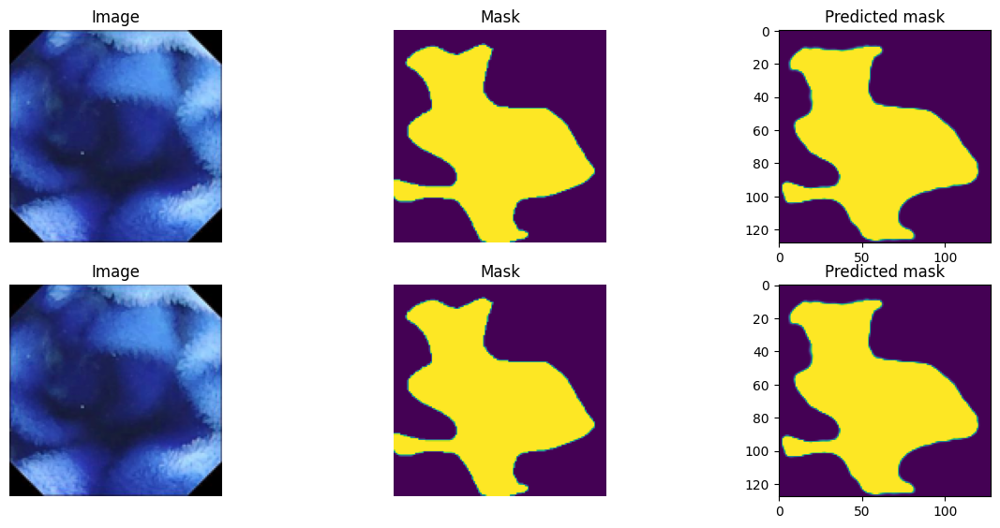


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2700 - iou_coef: 0.6679
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 29ms/step


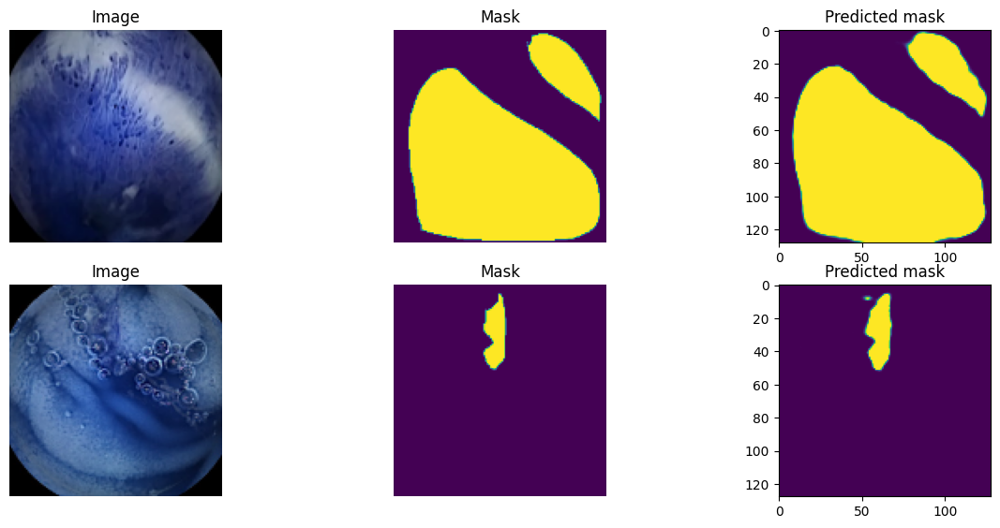


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2676 - iou_coef: 0.6705
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 21ms/step


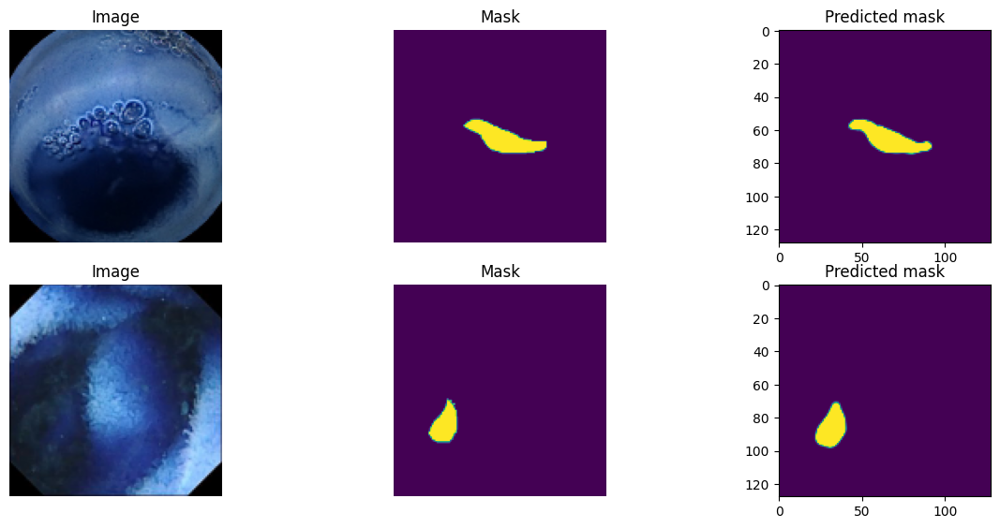


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2648 - iou_coef: 0.6733
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 23ms/step


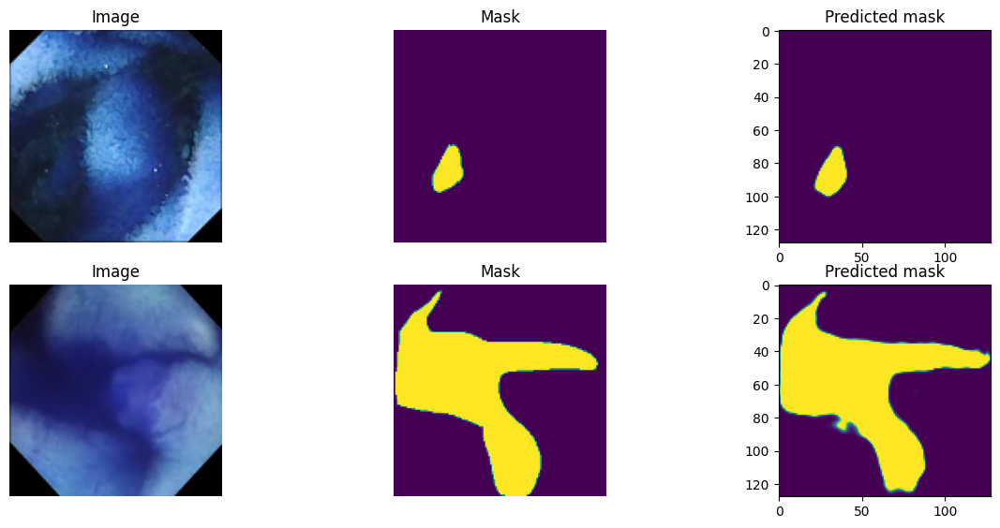


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2629 - iou_coef: 0.6750
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 23ms/step


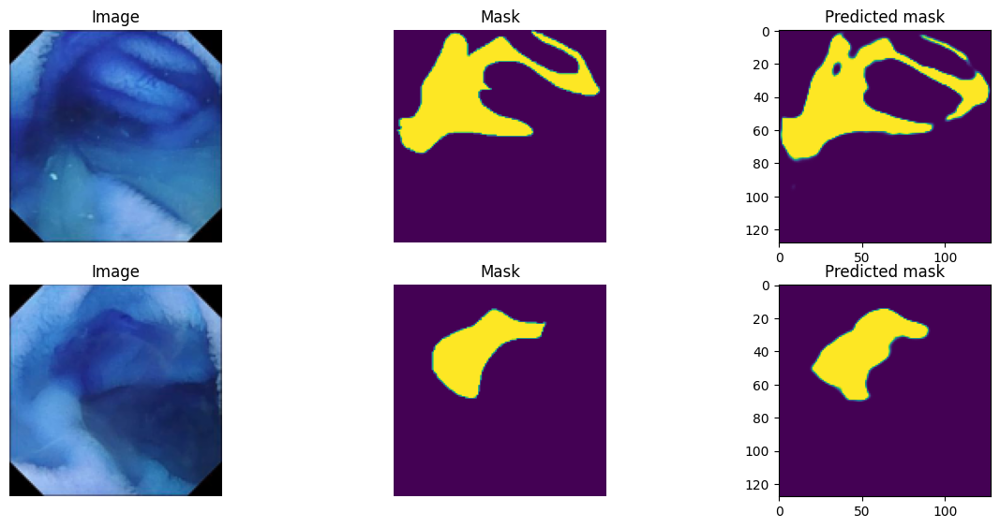


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2606 - iou_coef: 0.6771
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 22ms/step


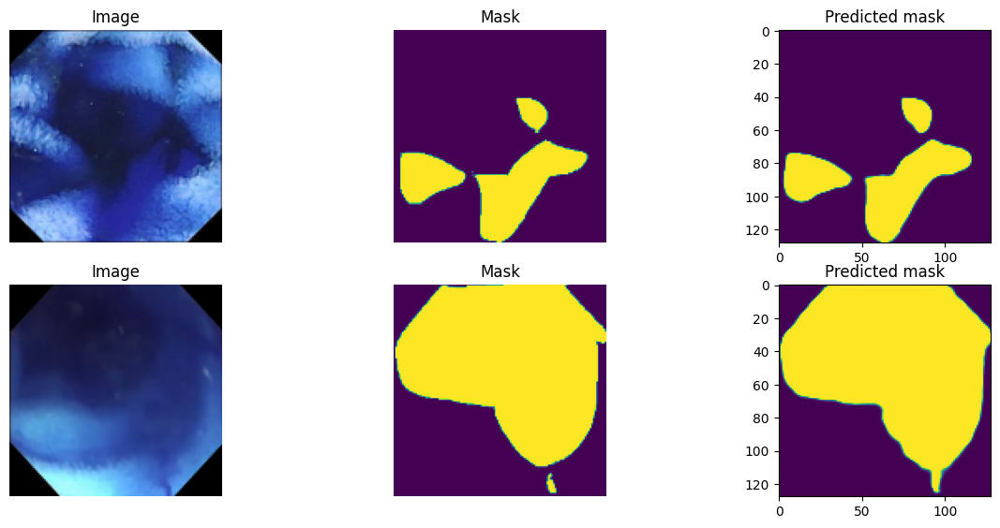


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2587 - iou_coef: 0.6784
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 21ms/step


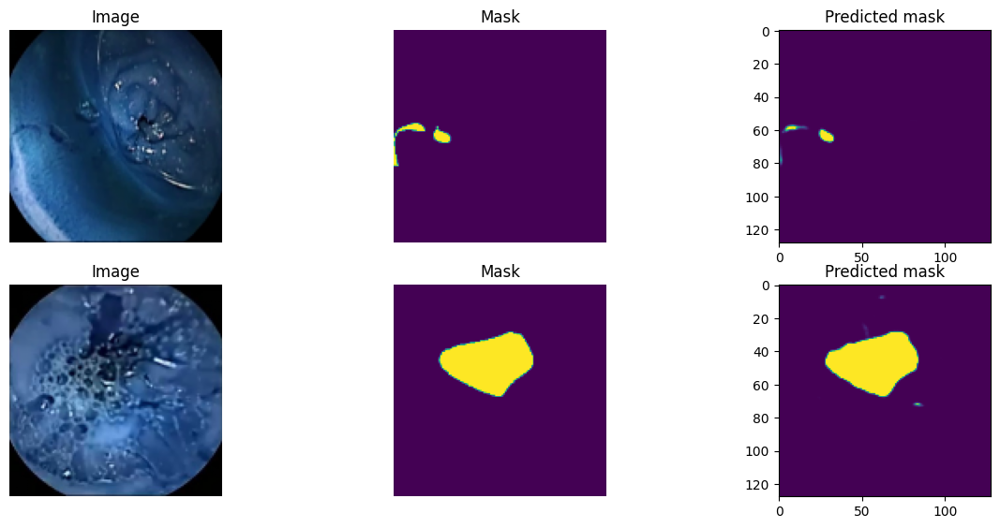


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2562 - iou_coef: 0.6814
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 22ms/step


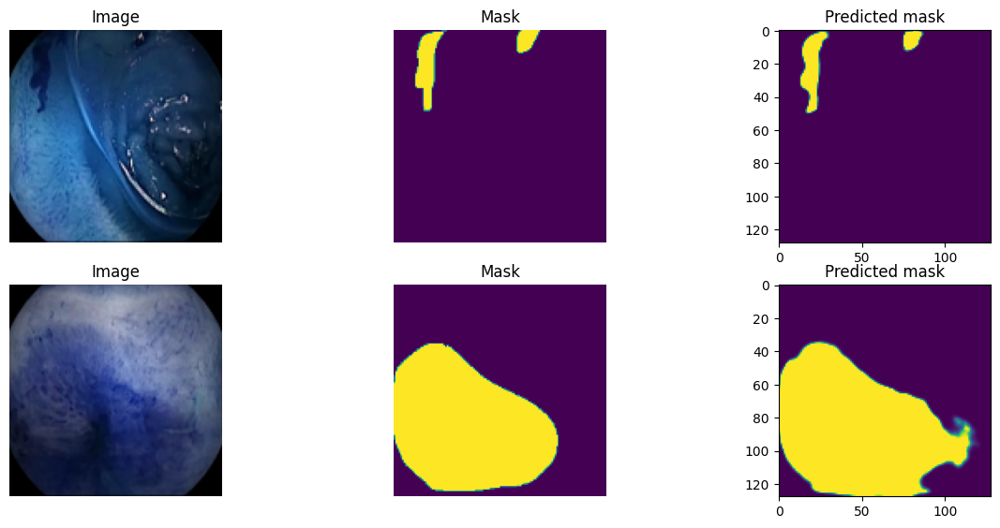


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2540 - iou_coef: 0.6838
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 22ms/step


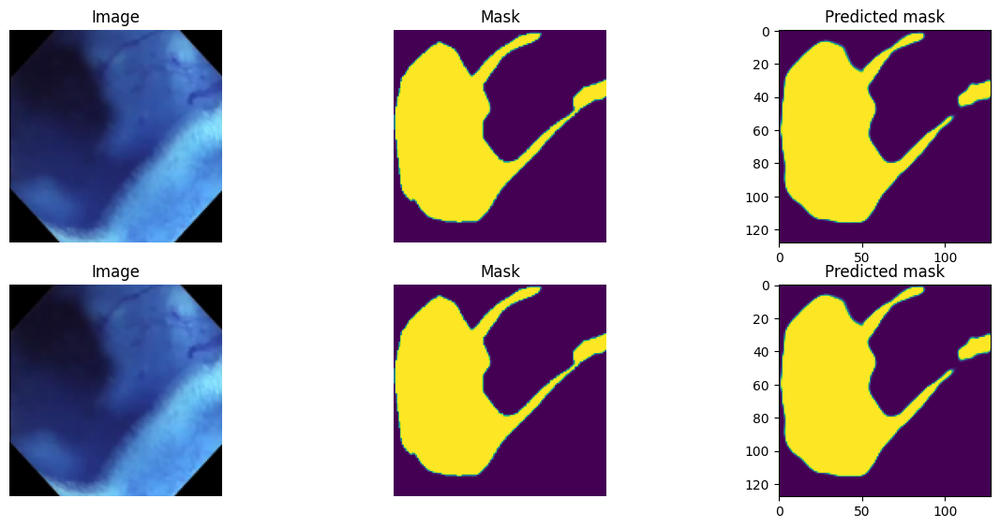


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2515 - iou_coef: 0.6863
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 21ms/step


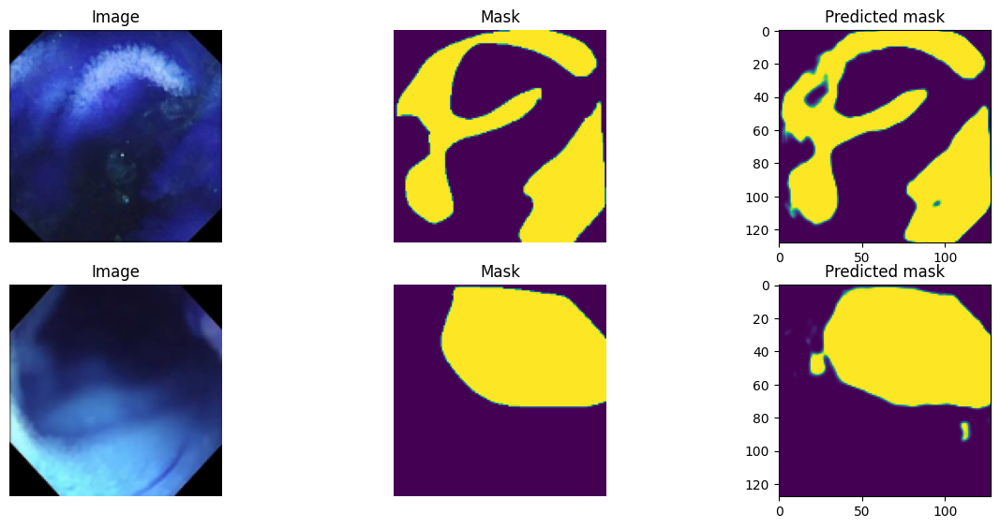


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2495 - iou_coef: 0.6881
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 21ms/step


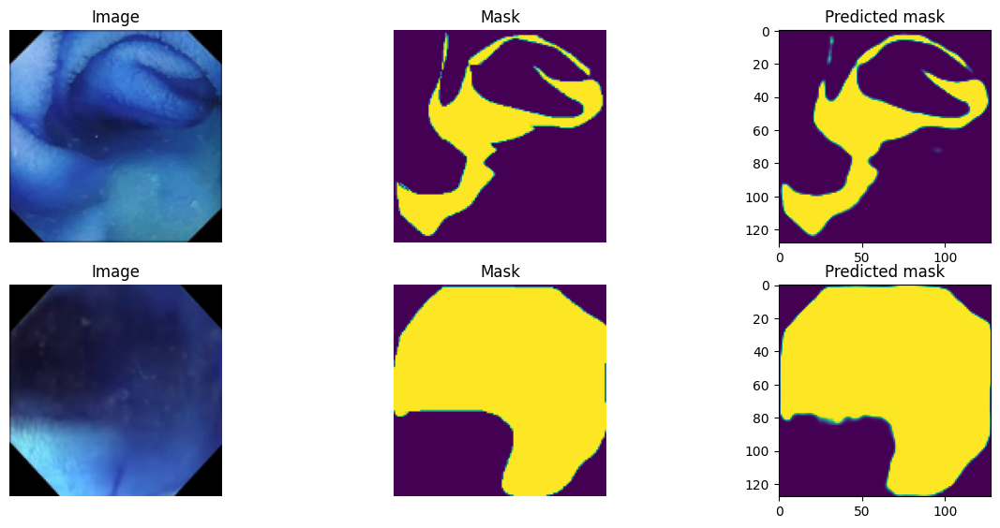


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2475 - iou_coef: 0.6897
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 21ms/step


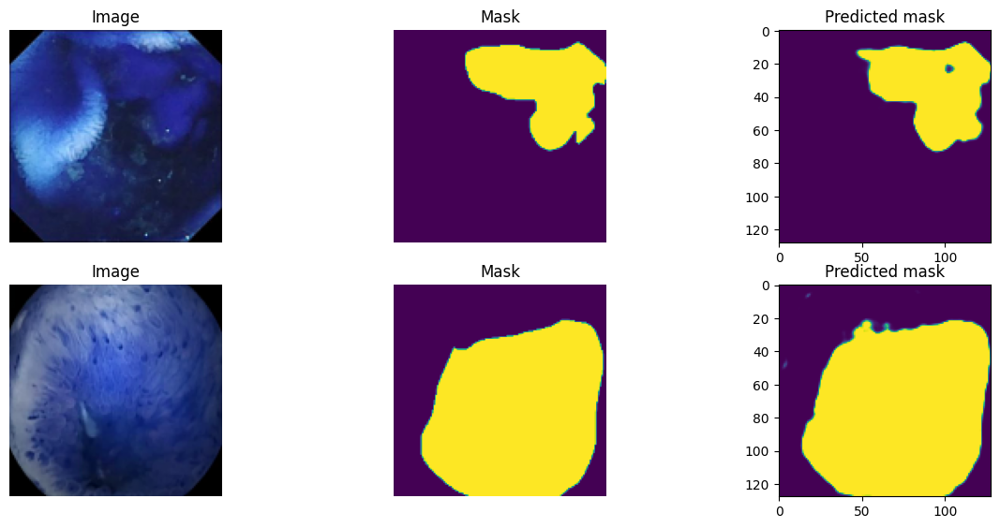


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2448 - iou_coef: 0.6932
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 23ms/step


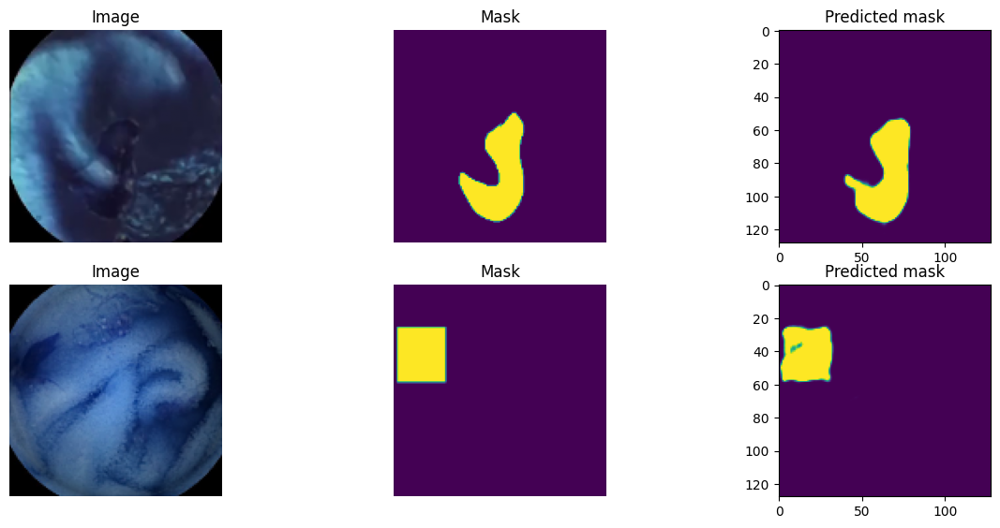


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2429 - iou_coef: 0.6949
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 23ms/step


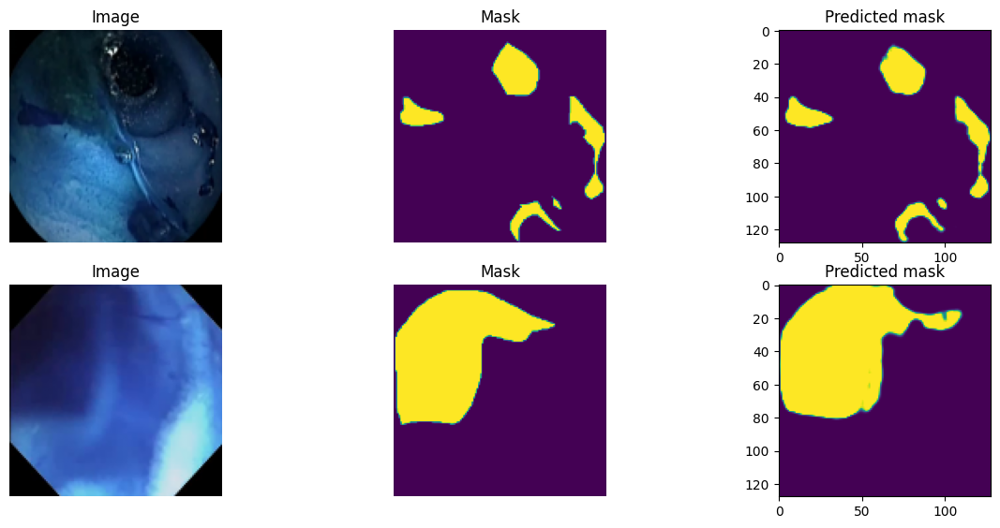


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2408 - iou_coef: 0.6973
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 24ms/step


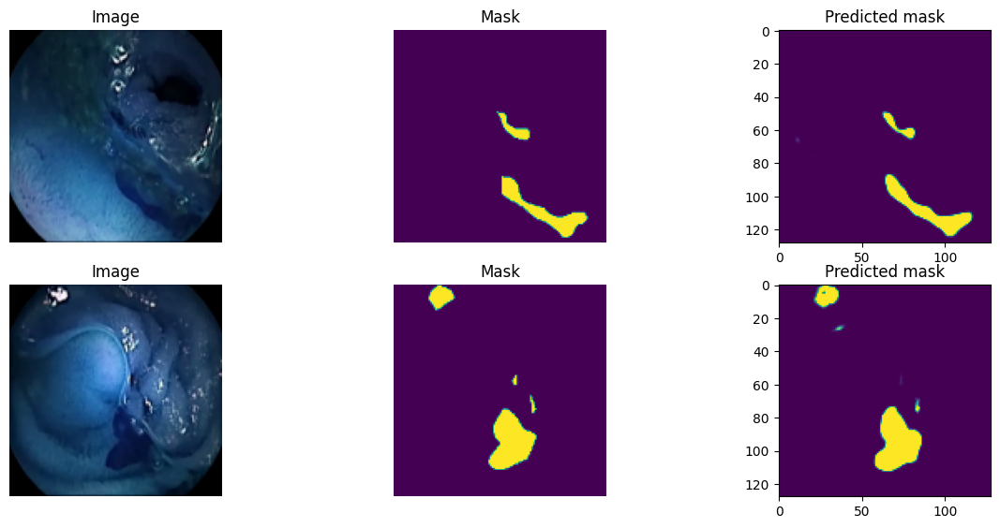


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2391 - iou_coef: 0.6989
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 22ms/step


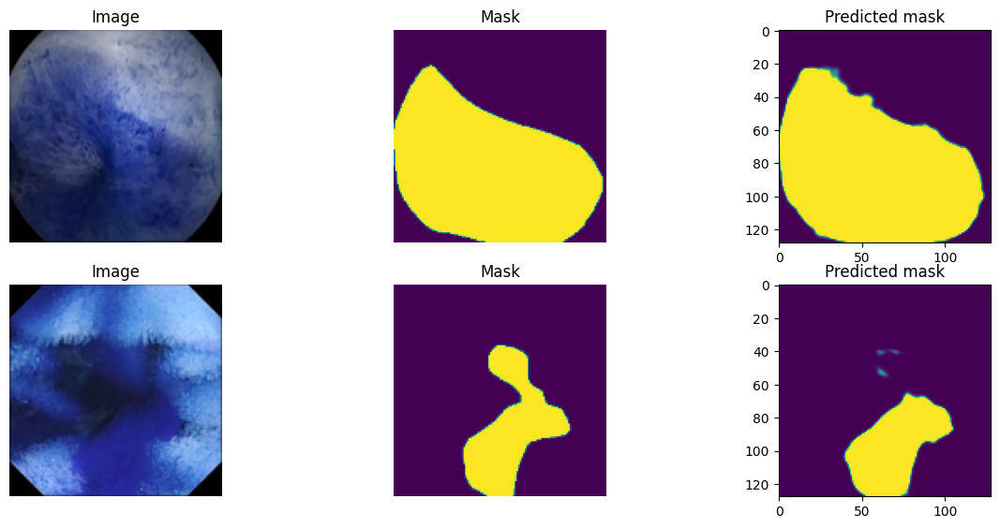


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2377 - iou_coef: 0.7006
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 21ms/step


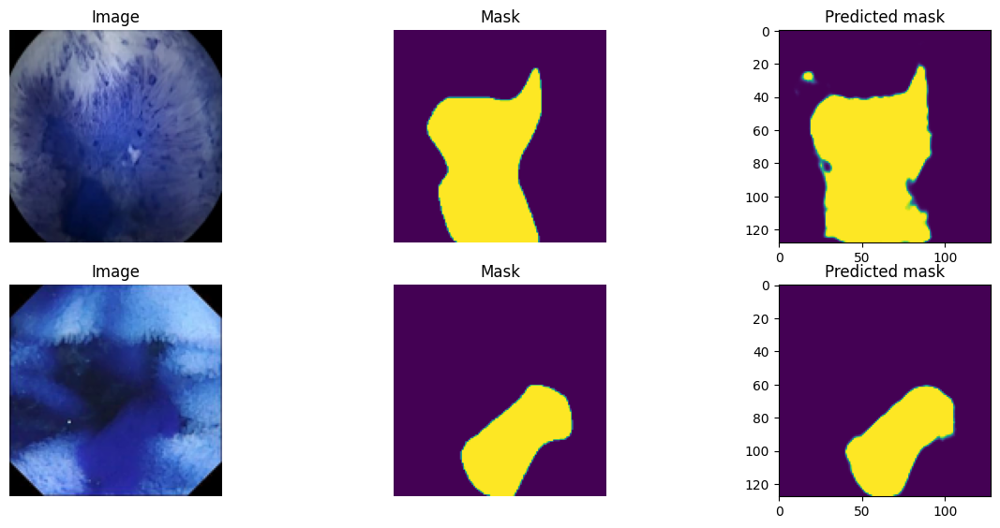


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2352 - iou_coef: 0.7033
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 30ms/step


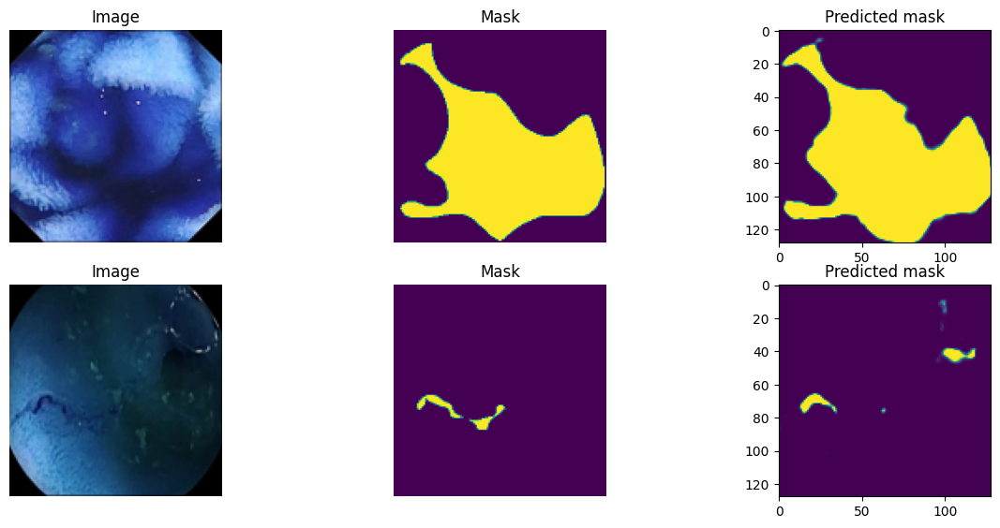


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2364 - iou_coef: 0.7020
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 28ms/step


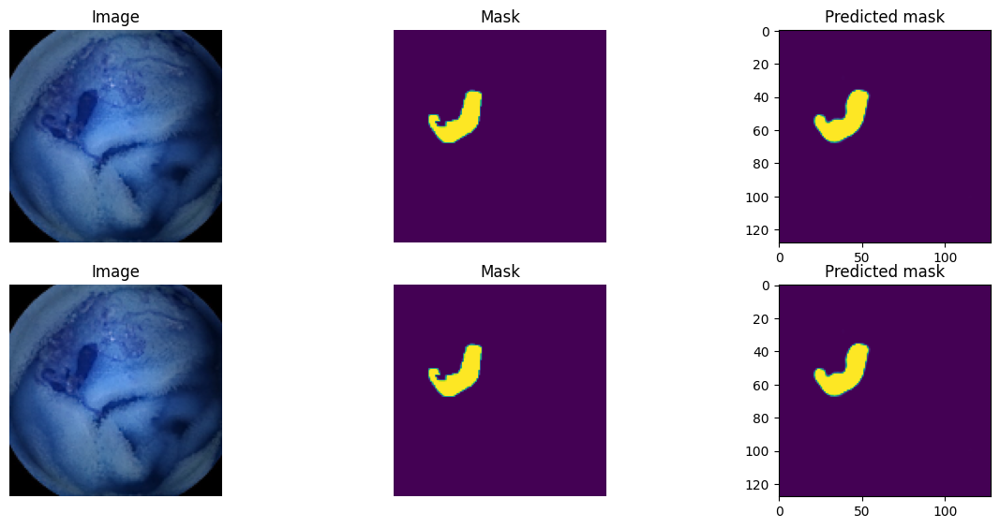


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.4091 - iou_coef: 0.5630
Epoch 1: val_loss did not improve from 0.72209
1/1 [==============================] - 0s 20ms/step


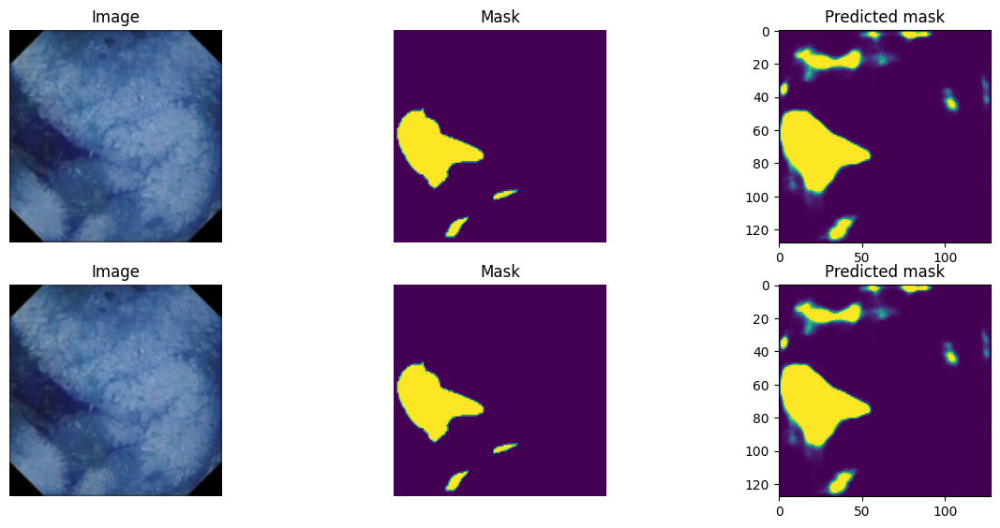


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.3503 - iou_coef: 0.5823
Epoch 1: val_loss improved from 0.72209 to 0.67651, saving model to /models/unet_best_model.hdf5
1/1 [==============================] - 0s 26ms/step


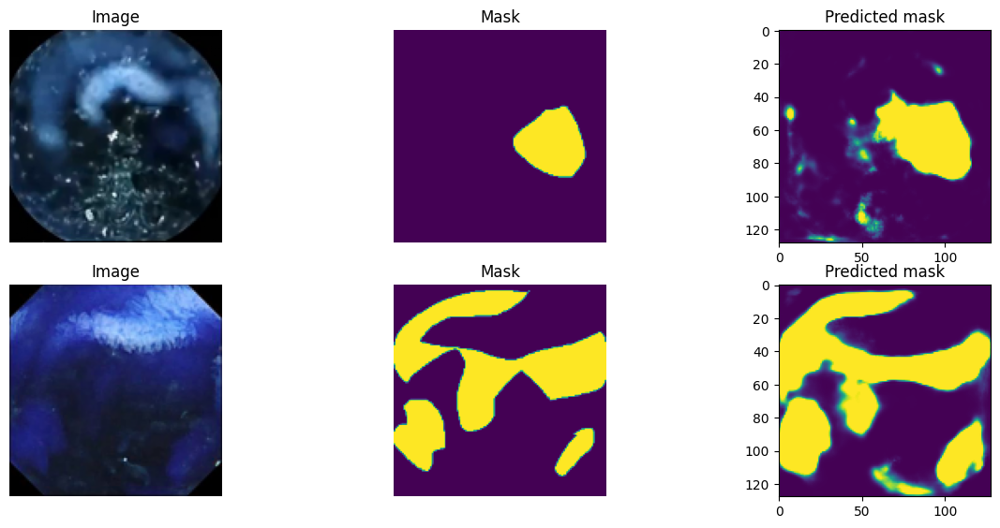


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2690 - iou_coef: 0.6621
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 20ms/step


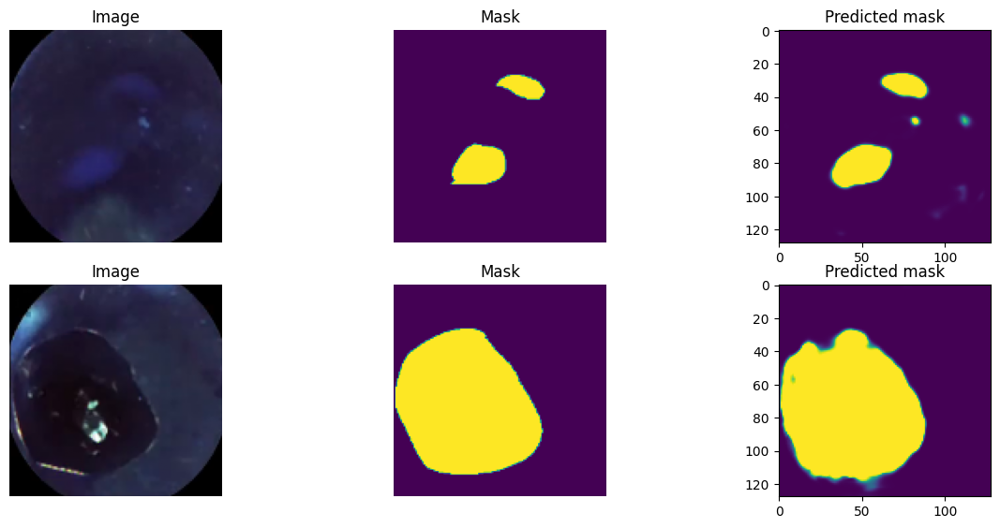


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2397 - iou_coef: 0.6956
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 22ms/step


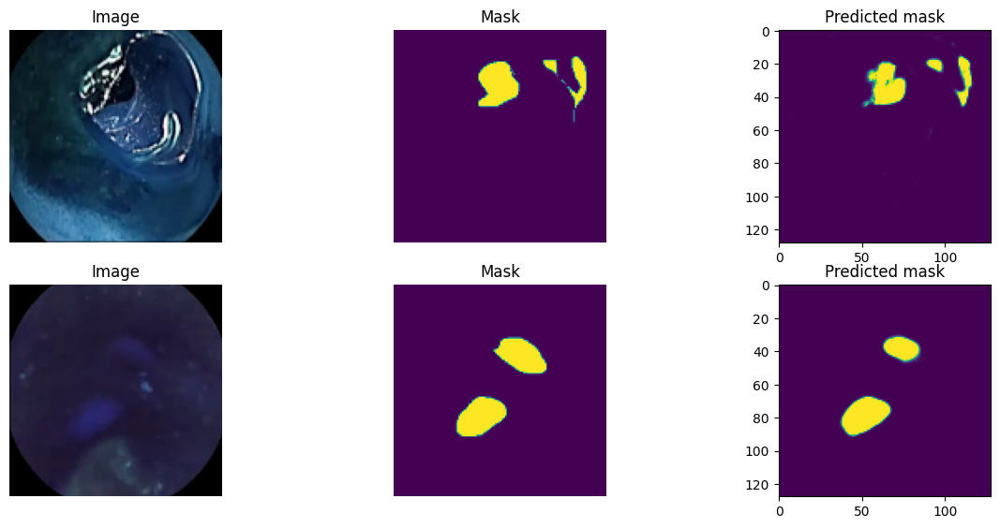


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2288 - iou_coef: 0.7086
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 21ms/step


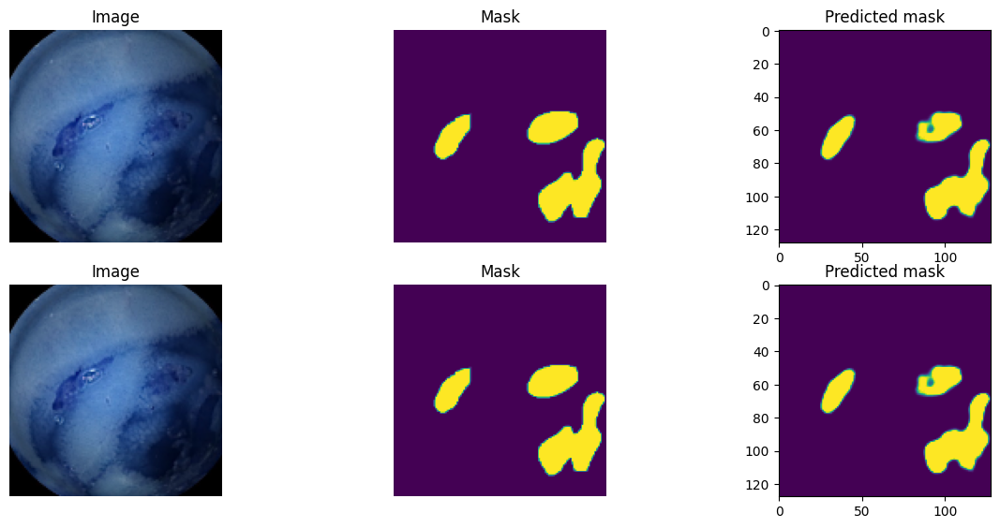


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2197 - iou_coef: 0.7188
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 21ms/step


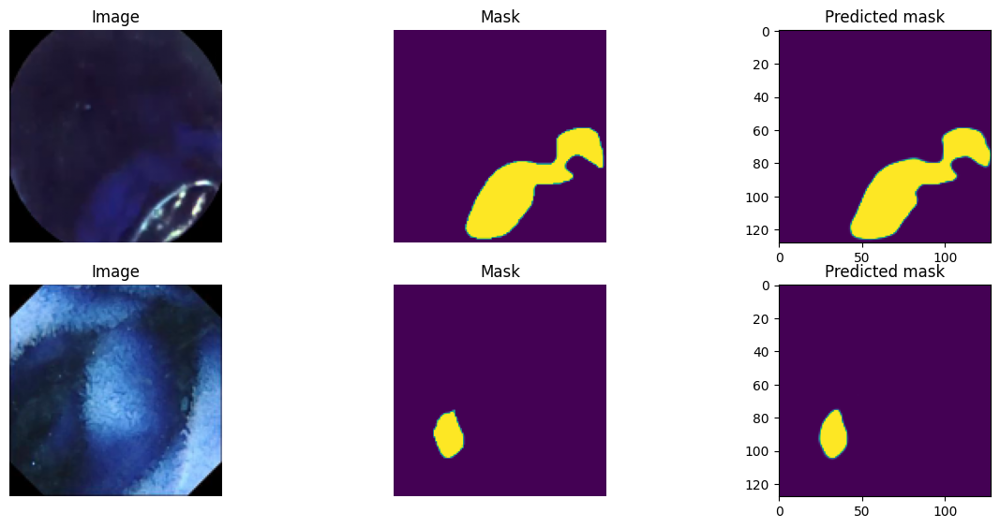


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2133 - iou_coef: 0.7266
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 22ms/step


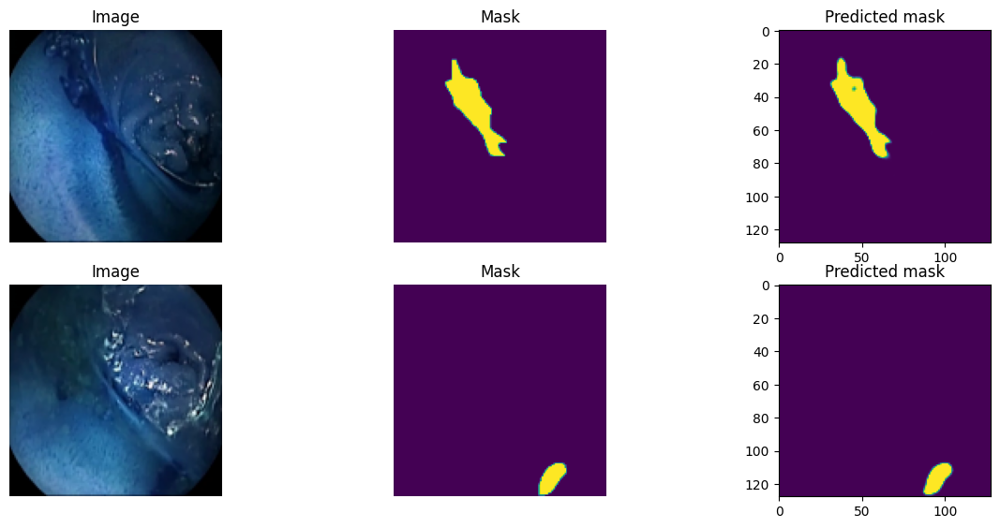


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2097 - iou_coef: 0.7308
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 22ms/step


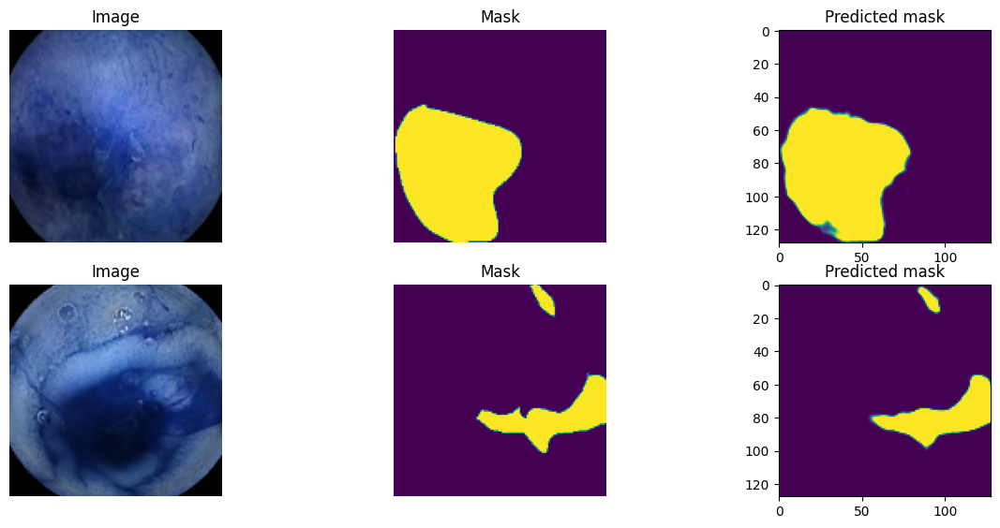


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2072 - iou_coef: 0.7339
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 24ms/step


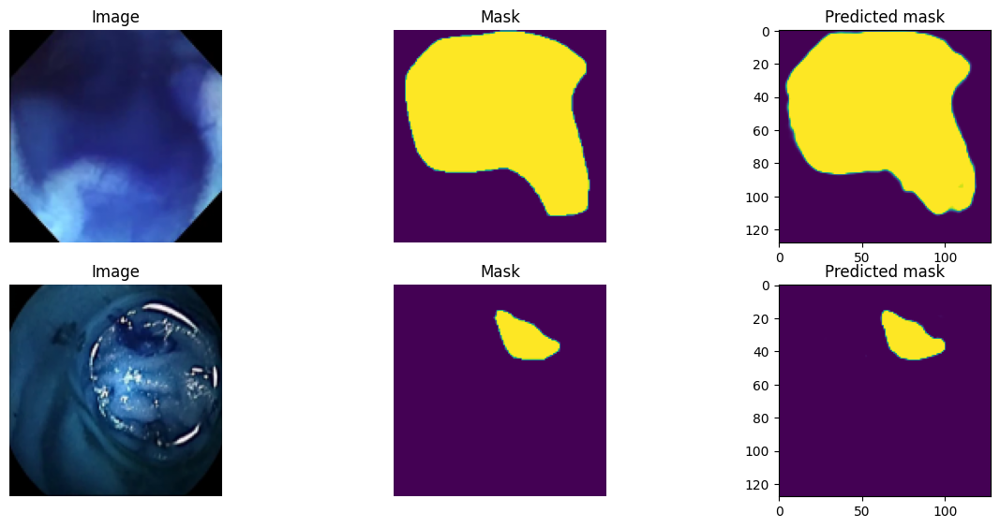


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2057 - iou_coef: 0.7352
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 22ms/step


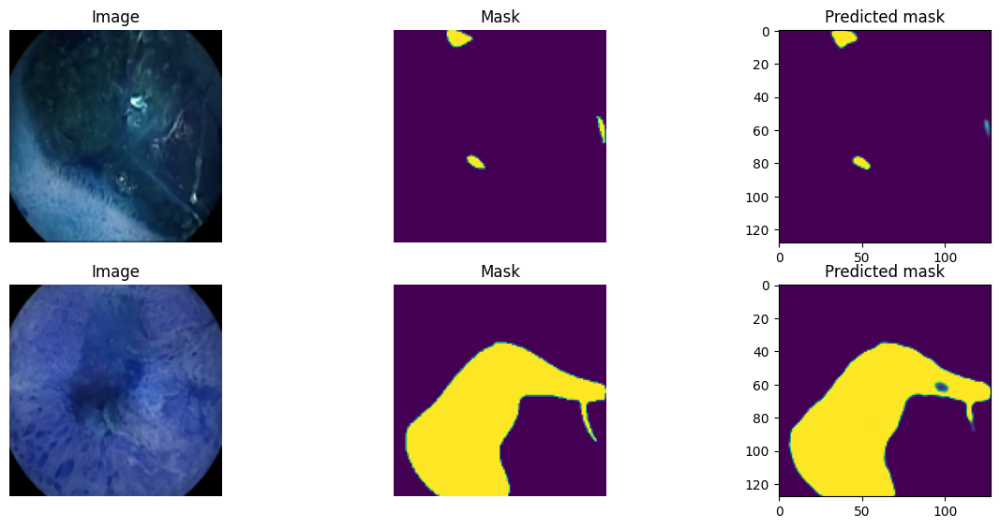


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2044 - iou_coef: 0.7367
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 23ms/step


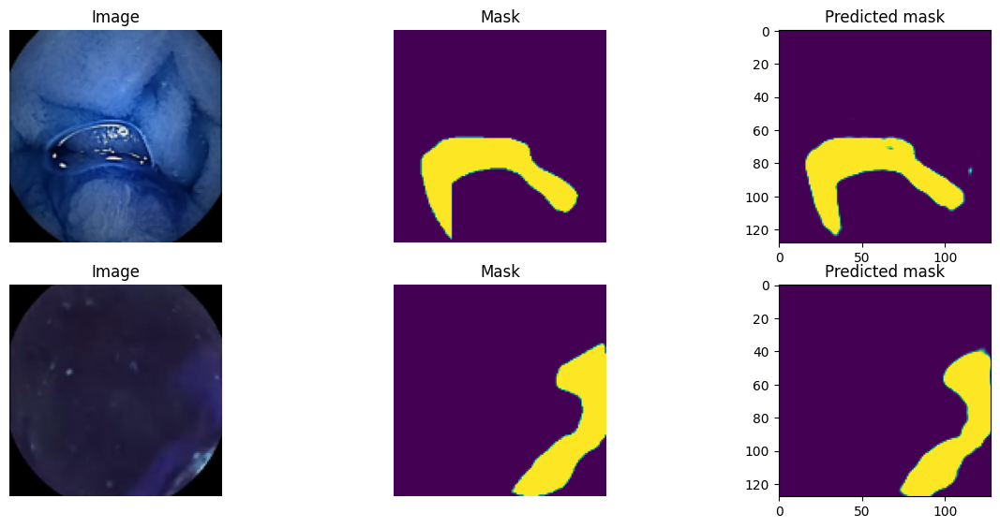


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2029 - iou_coef: 0.7384
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 22ms/step


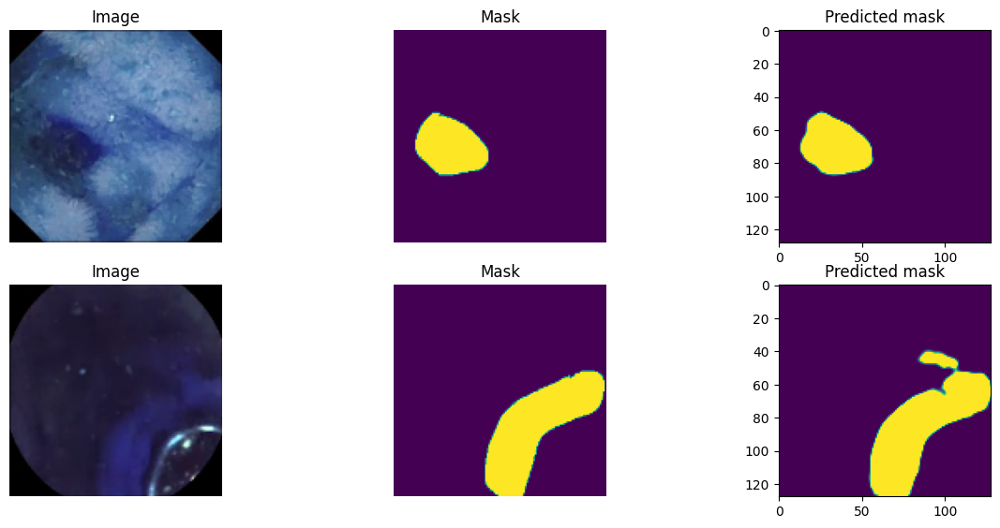


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2009 - iou_coef: 0.7402
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 23ms/step


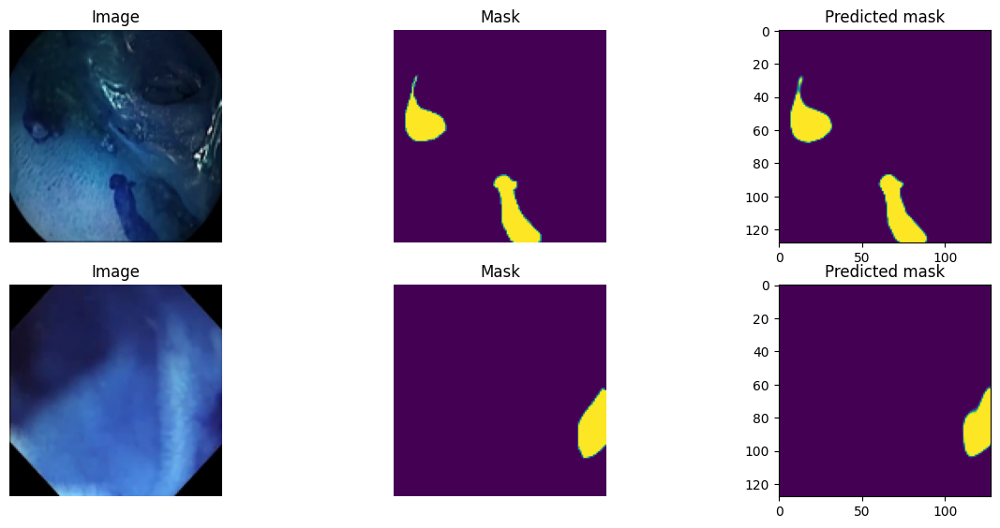


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1988 - iou_coef: 0.7425
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 24ms/step


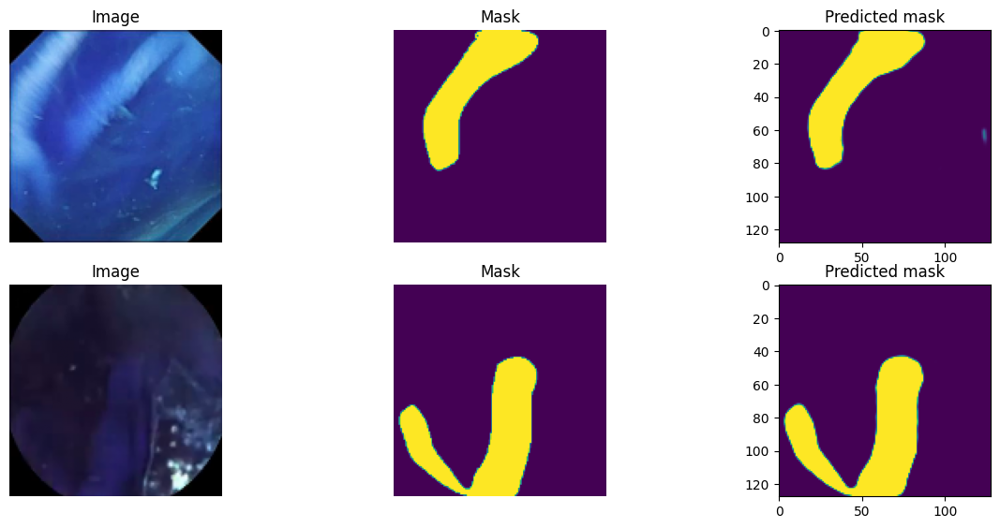


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1972 - iou_coef: 0.7444
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 23ms/step


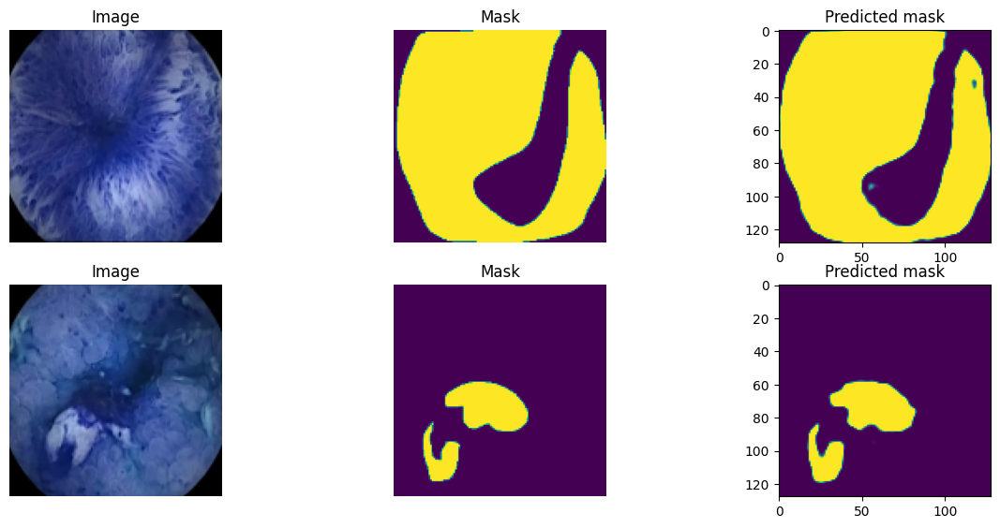


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1952 - iou_coef: 0.7464
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 23ms/step


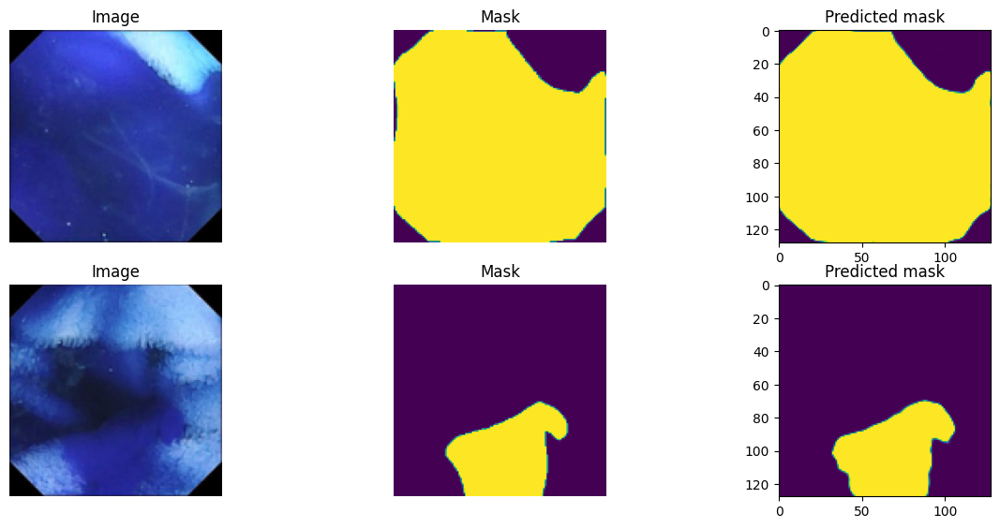


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1940 - iou_coef: 0.7475
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 25ms/step


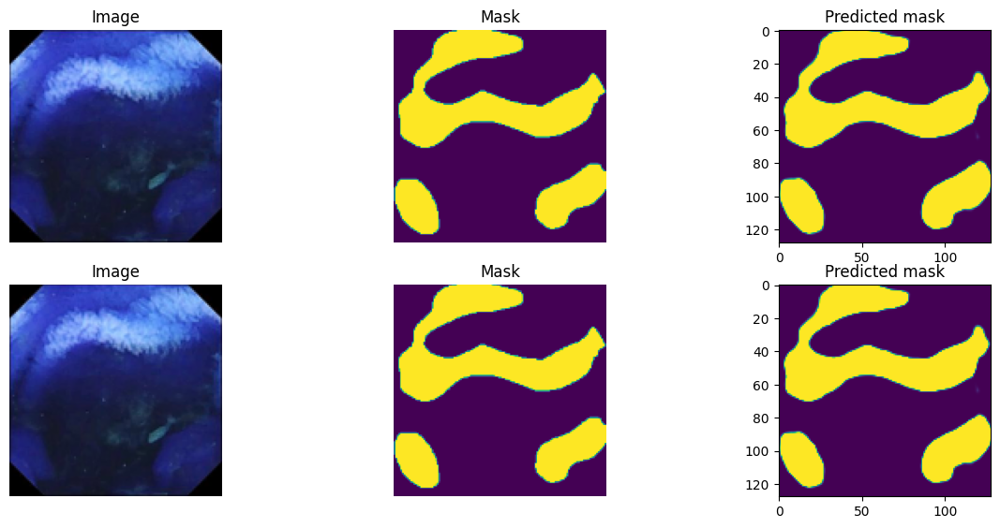


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1924 - iou_coef: 0.7494
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 25ms/step


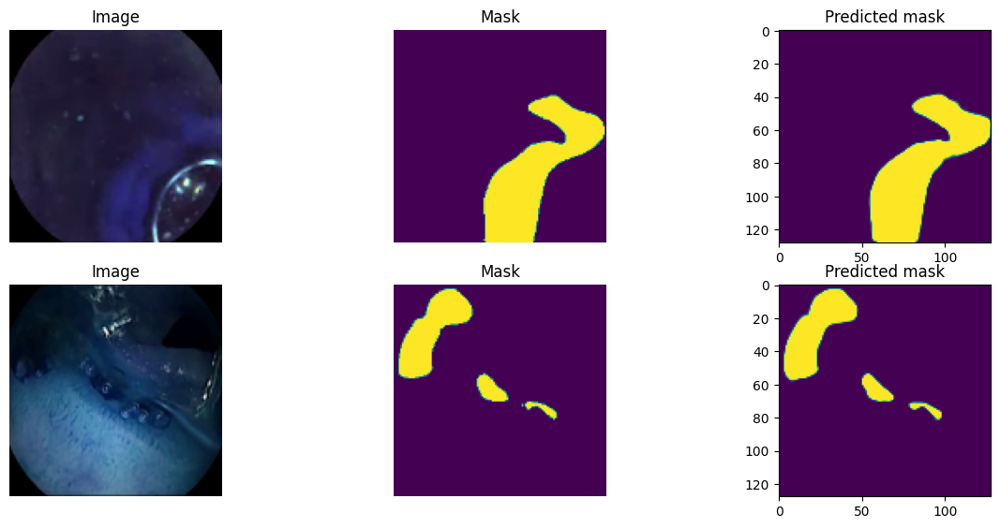


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1905 - iou_coef: 0.7517
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 22ms/step


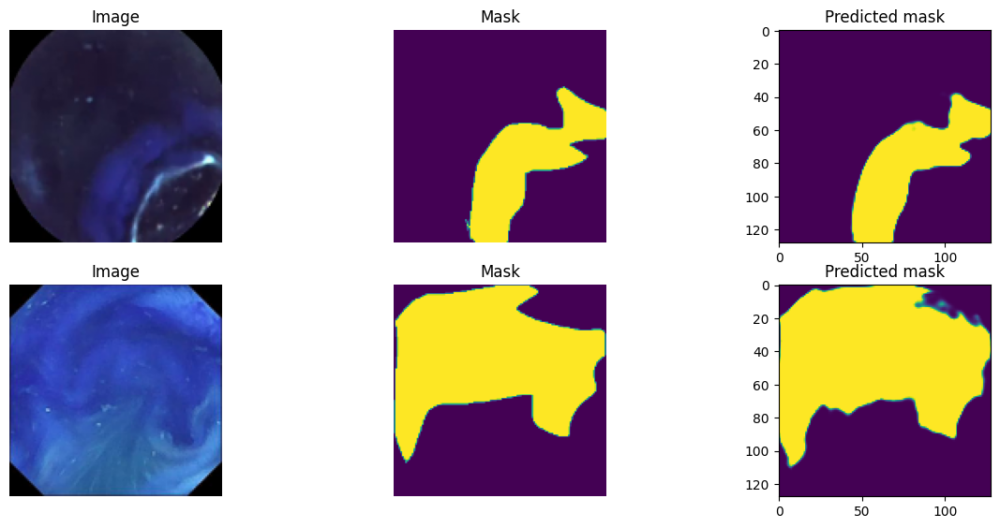


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1888 - iou_coef: 0.7536
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 23ms/step


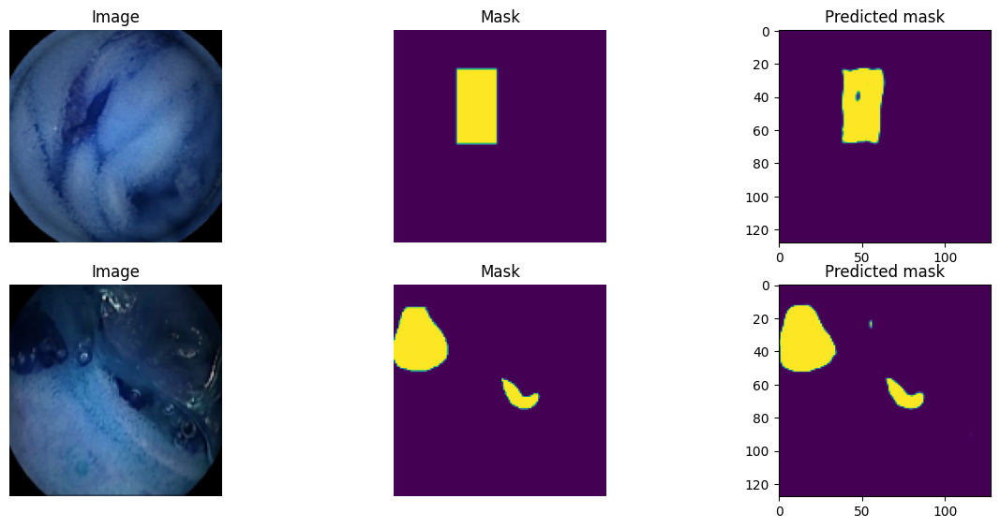


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1870 - iou_coef: 0.7553
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 23ms/step


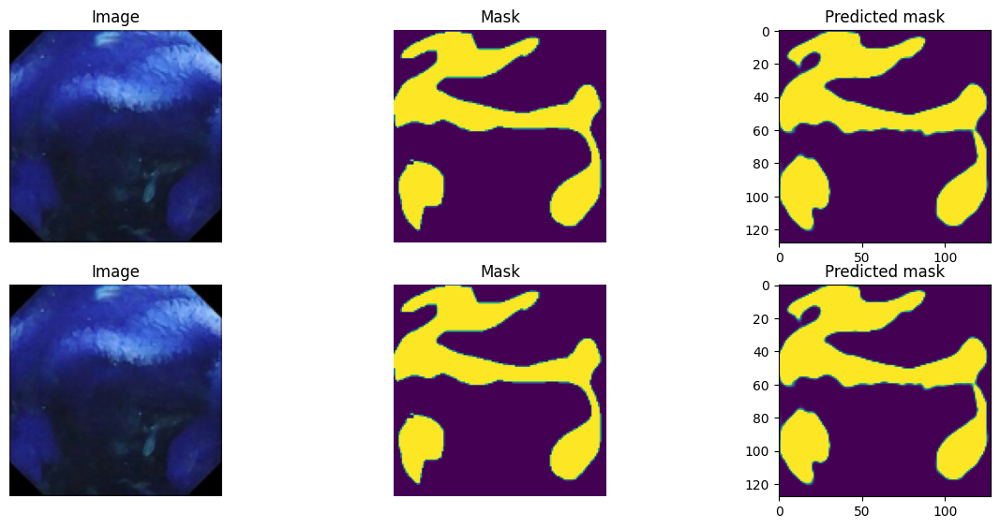


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1856 - iou_coef: 0.7574
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 23ms/step


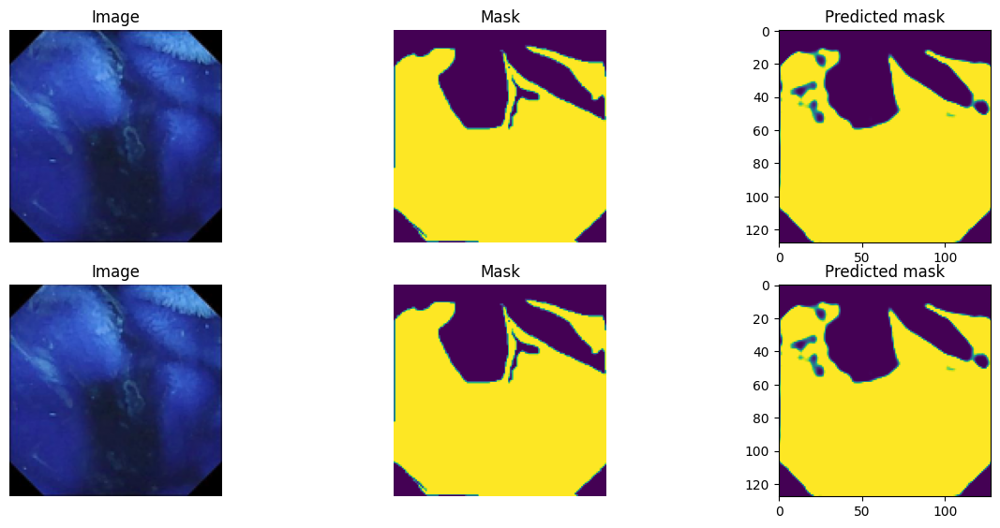


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1840 - iou_coef: 0.7588
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 23ms/step


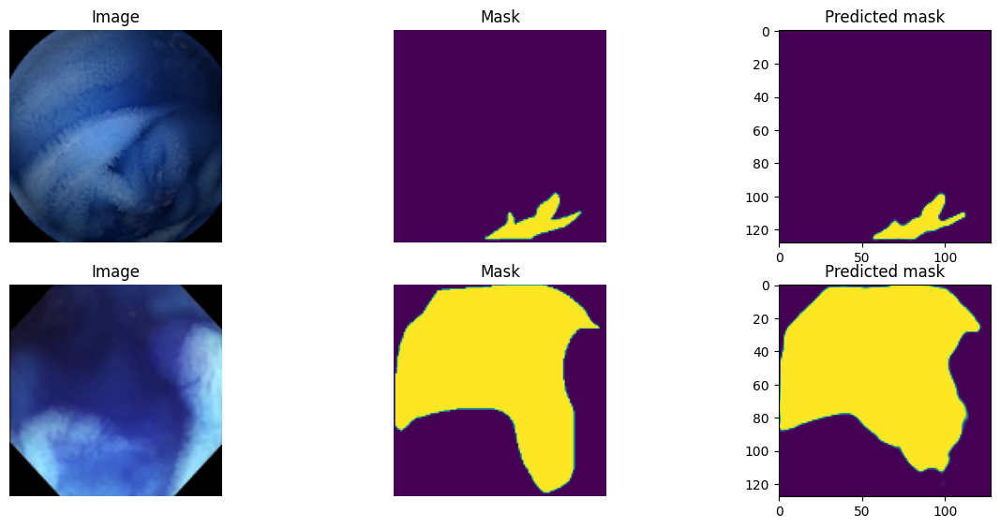


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1830 - iou_coef: 0.7598
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 25ms/step


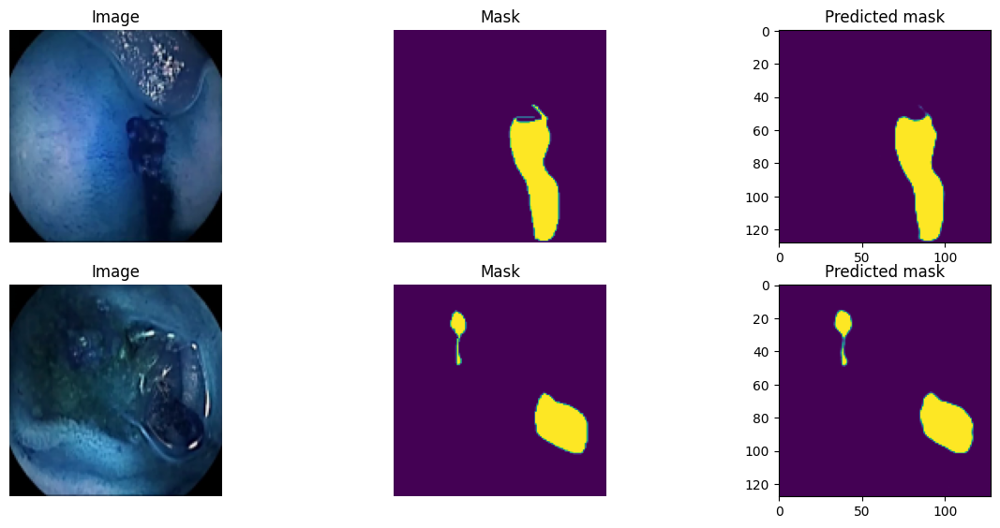


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1816 - iou_coef: 0.7610
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 29ms/step


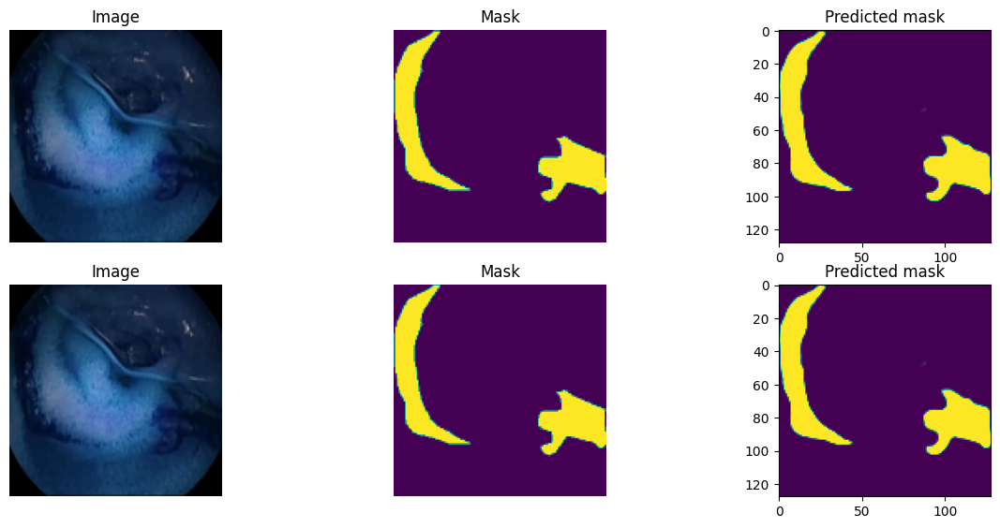


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1800 - iou_coef: 0.7626
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 28ms/step


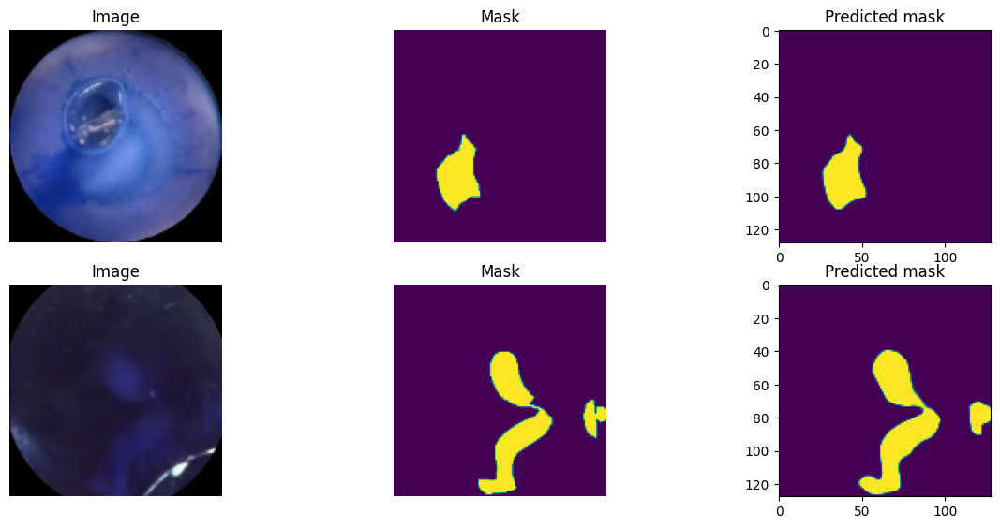


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1781 - iou_coef: 0.7652
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 23ms/step


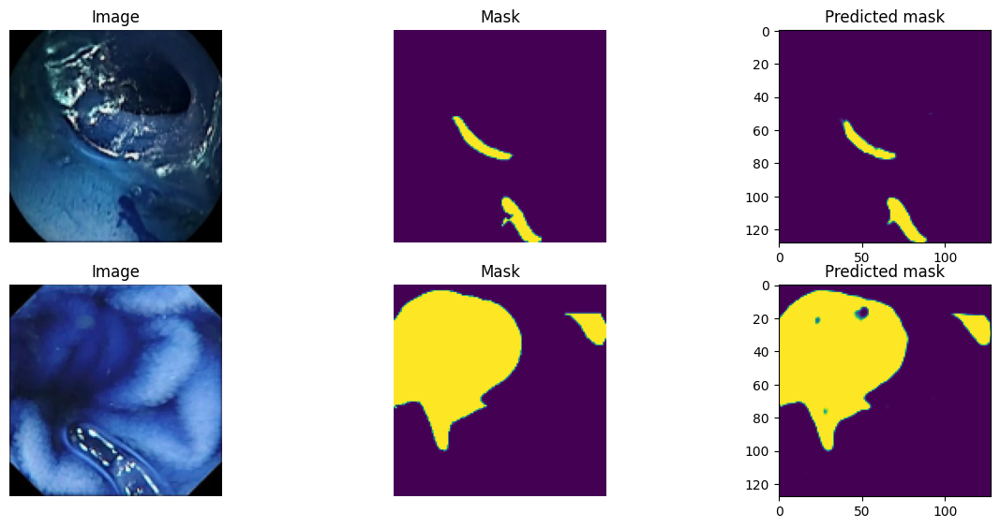


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1945 - iou_coef: 0.7547
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 22ms/step


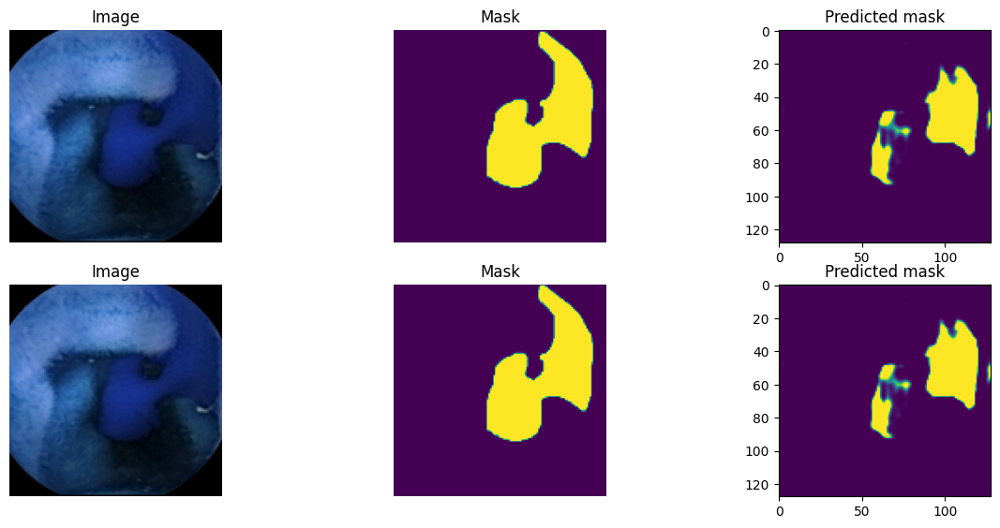


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.4258 - iou_coef: 0.5461
Epoch 1: val_loss did not improve from 0.67651
1/1 [==============================] - 0s 22ms/step


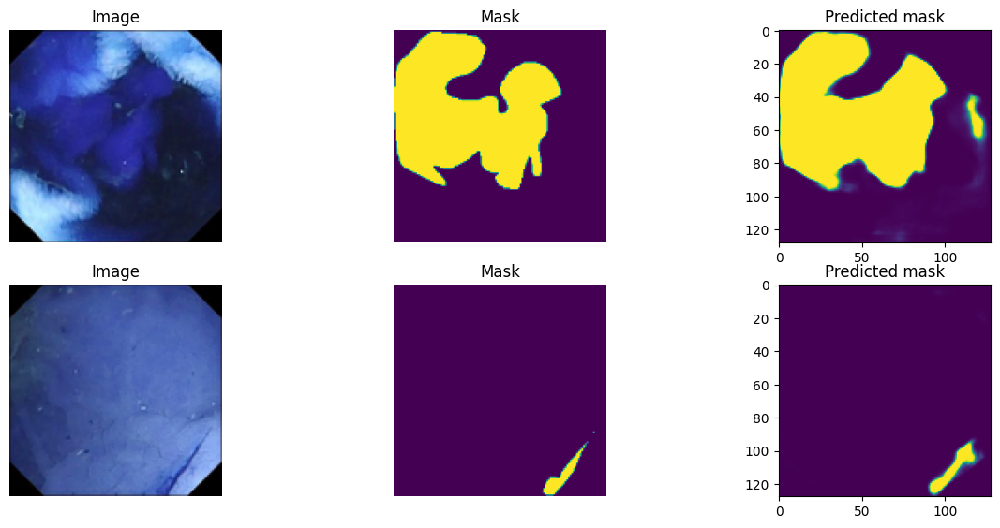


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2459 - iou_coef: 0.6859
Epoch 1: val_loss improved from 0.67651 to 0.66749, saving model to /models/unet_best_model.hdf5
1/1 [==============================] - 0s 23ms/step


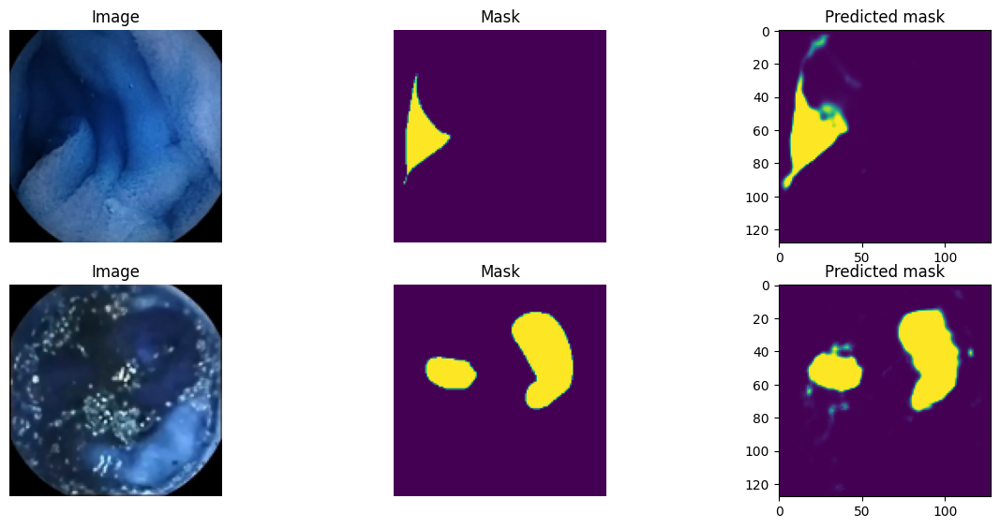


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.2015 - iou_coef: 0.7360
Epoch 1: val_loss did not improve from 0.66749
1/1 [==============================] - 0s 22ms/step


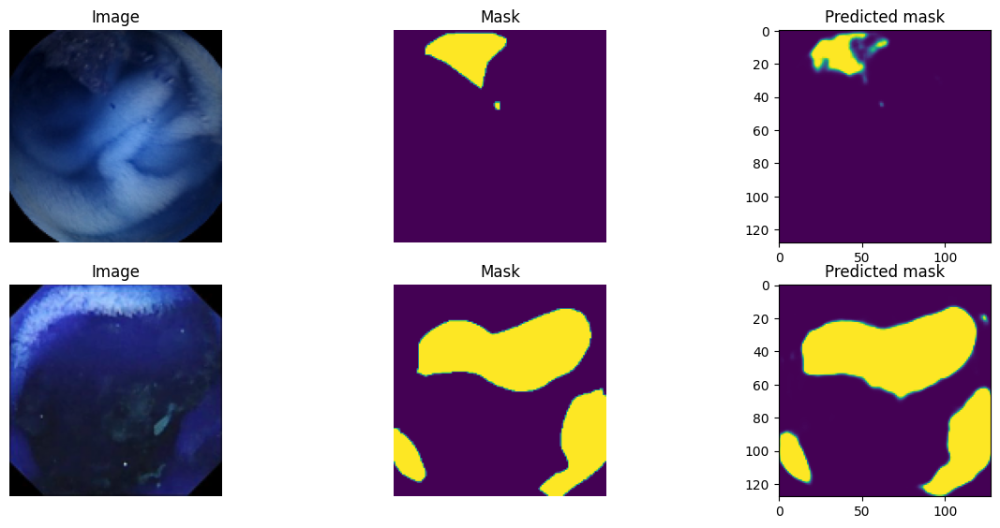


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1793 - iou_coef: 0.7626
Epoch 1: val_loss did not improve from 0.66749
1/1 [==============================] - 0s 21ms/step


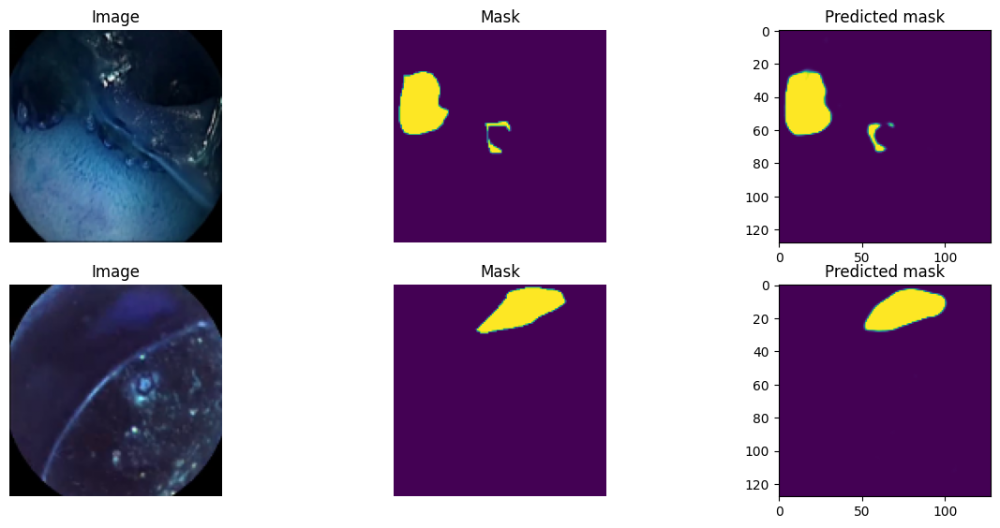


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1699 - iou_coef: 0.7741
Epoch 1: val_loss did not improve from 0.66749
1/1 [==============================] - 0s 22ms/step


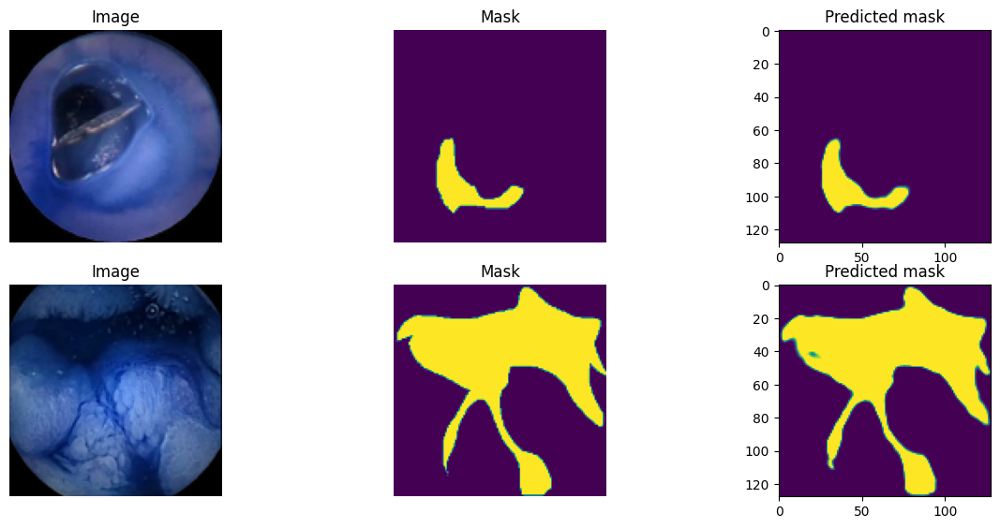


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1643 - iou_coef: 0.7809
Epoch 1: val_loss did not improve from 0.66749
1/1 [==============================] - 0s 22ms/step


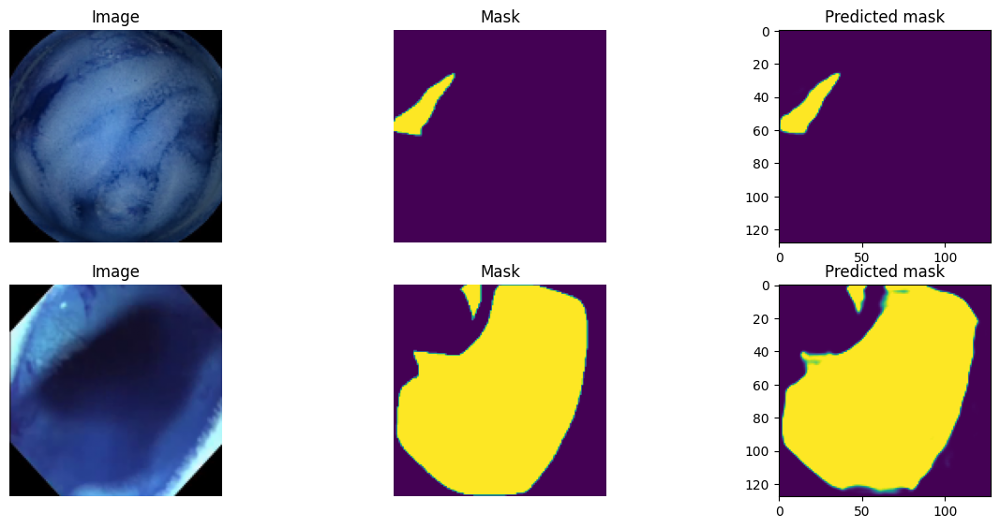


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1612 - iou_coef: 0.7850
Epoch 1: val_loss did not improve from 0.66749
1/1 [==============================] - 0s 20ms/step


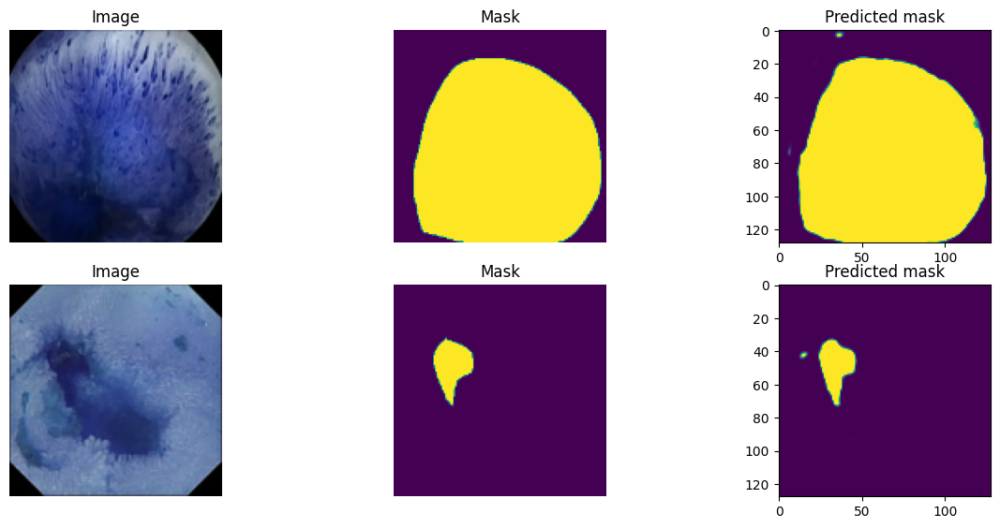


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
131/131 [==============================] - ETA: 0s - loss: 0.1590 - iou_coef: 0.7877
Epoch 1: val_loss did not improve from 0.66749
131/131 [==============================] - 29s 218ms/step - loss: 0.1590 - iou_coef: 0.7877 - val_loss: 0.8065 - val_iou_coef: 0.4920 - lr: 1.0000e-04


In [ ]:
epochs = 100
for _ in range(epochs):
    history = model.fit(
        train_gen, 
        validation_data = val_gen, 
        epochs=1,
        callbacks=callbacks_list,
        steps_per_epoch=len(train_gen),
        validation_steps = len(val_gen)
    )
    plot_sample_predictions(model, train_gen, count_images=2)

1/1 [==============================] - 0s 36ms/step


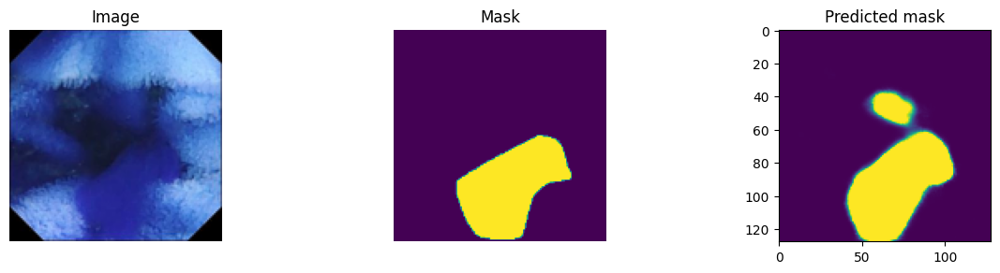

1/1 [==============================] - 0s 36ms/step


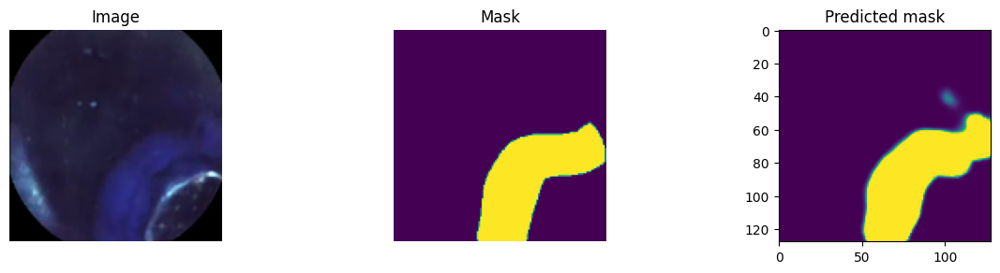

1/1 [==============================] - 0s 36ms/step


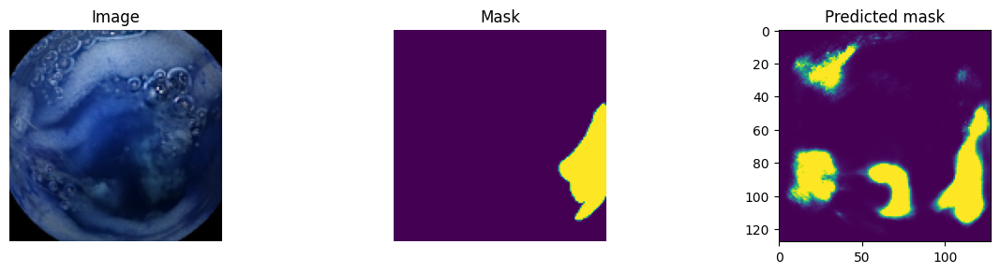

1/1 [==============================] - 0s 25ms/step


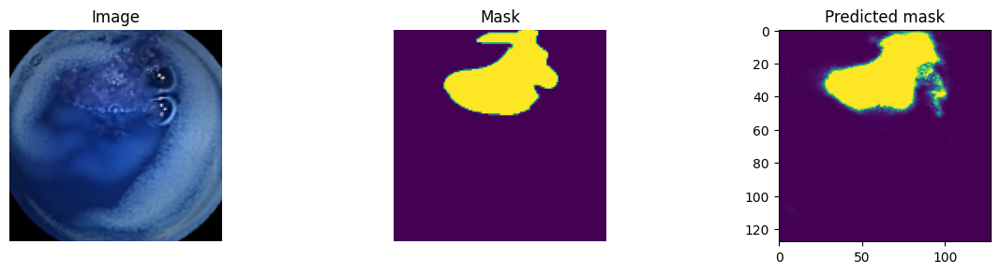

1/1 [==============================] - 0s 27ms/step


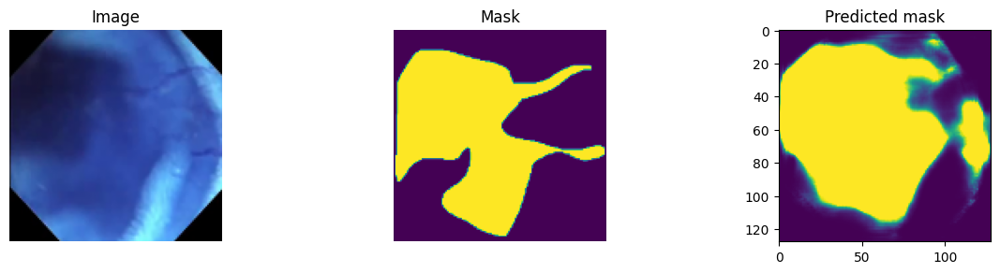

1/1 [==============================] - 0s 24ms/step


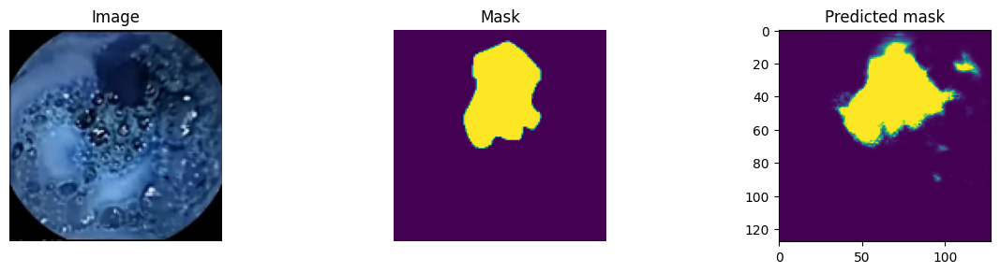

1/1 [==============================] - 0s 22ms/step


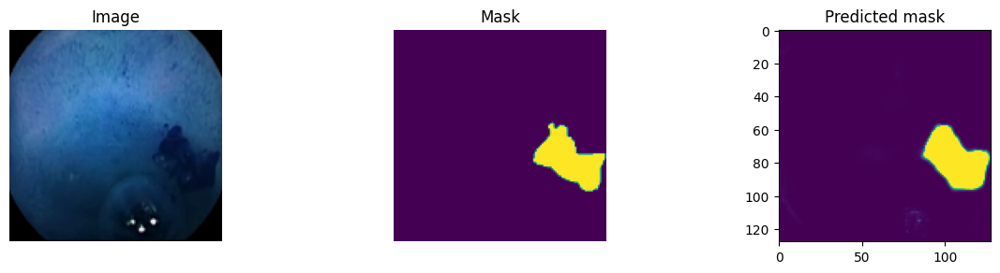

1/1 [==============================] - 0s 25ms/step


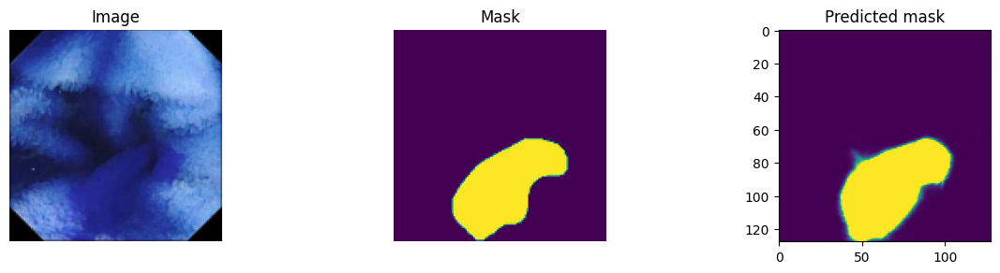

1/1 [==============================] - 0s 21ms/step


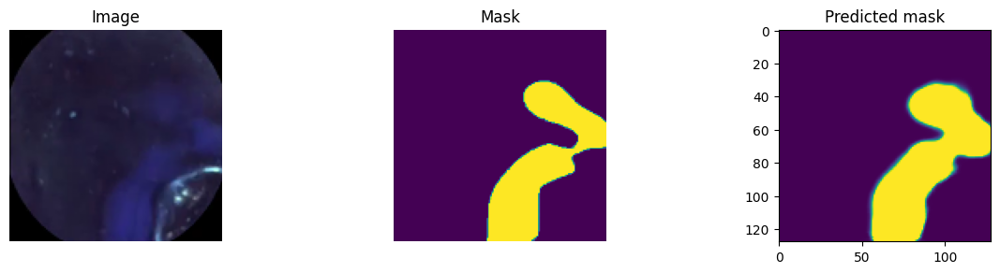

1/1 [==============================] - 0s 23ms/step


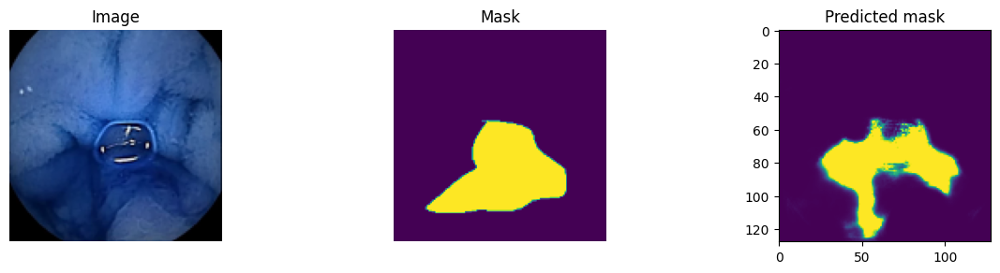

In [175]:
plot_sample_predictions(model, val_gen, count_images=1)
plot_sample_predictions(model, val_gen, count_images=1)
plot_sample_predictions(model, val_gen, count_images=1)
plot_sample_predictions(model, val_gen, count_images=1)
plot_sample_predictions(model, val_gen, count_images=1)
plot_sample_predictions(model, val_gen, count_images=1)
plot_sample_predictions(model, val_gen, count_images=1)
plot_sample_predictions(model, val_gen, count_images=1)
plot_sample_predictions(model, val_gen, count_images=1)
plot_sample_predictions(model, val_gen, count_images=1)

In [173]:
IMG_PATH = '../input/wcebleedgen/Test Dataset/Test Dataset 1'
IMG_NUM = len(os.listdir(IMG_PATH))
for (n, FILE_NAME) in enumerate(os.listdir(IMG_PATH)):
    img = IMG_PATH + '/' + FILE_NAME
    shutil.copy(img, 'TEST'+ '/T1/' + FILE_NAME)

## Prediction

In [112]:
image_paths_list = '/kaggle/working/TEST/T1'
z1 = []
for path in os.listdir(image_paths_list):
    z1.append(path) 
df = pd.DataFrame.from_dict({"files": z1})
df.to_csv('sample-submission.csv', index=False)

In [181]:
image_paths_list_2 = '/kaggle/working/TEST/T2'
z2 = []
for path in os.listdir(image_paths_list_2):
    z2.append(path) 
df = pd.DataFrame.from_dict({"files": z2})
df.to_csv('sample-submission_2.csv', index=False)

In [113]:
sample_submission = pd.read_csv('sample-submission.csv')
sample_submission.head()

,files
0,A0043.png
1,A0042.png
2,A0034.png
3,A0020.png
4,A0003.png


In [182]:
sample_submission_2 = pd.read_csv('sample-submission_2.csv')
sample_submission_2.head()

,files
0,A0550.png
1,A0052.png
2,A0558.png
3,A0357.png
4,A0159.png


In [179]:
!ls ../input

wcebleedgen


In [115]:
def get_mask(model, img_orig, threshold = None):
    mask = model.predict(img_orig)
    if threshold is not None:
        mask = np.where(mask > threshold, 1, 0)
    return mask

In [116]:
image_paths_list = '/kaggle/working/TEST/T1'
predictions = []
from tqdm.notebook import tqdm
for path in tqdm(os.listdir(image_paths_list)):
    p1 = os.path.join(image_paths_list, path)
    image = cv2.imread(p1) 
    image = cv2.resize(image , IMAGE_SIZE)
    image = np.array(image)
    image = image.reshape(1, *image.shape)
    image = image / 255
    predictions.append(get_mask(model,image, 0.2))

  0%|          | 0/49 [00:00<?, ?it/s]

1/1 [==============================] - 0s 22ms/step


In [117]:
def mask_to_rle(mask):
    mask_flat = mask.flatten('F')
    flag = 0
    rle_list = list()
    for i in range(mask_flat.shape[0]):
        if flag == 0:
            if mask_flat[i] == 1:
                flag = 1
                starts = i+1
                rle_list.append(starts)
        else:
            if mask_flat[i] == 0:
                flag = 0
                ends = i
                rle_list.append(ends-starts+1)
    if flag == 1:
        ends = mask_flat.shape[0]
        rle_list.append(ends-starts+1)
    #sanity check
    if len(rle_list) % 2 != 0:
        print('NG')
    if len(rle_list) == 0:
        rle = np.nan
    else:
        rle = ' '.join(map(str,rle_list))
    return rle

predictions_encoded = [mask_to_rle(mask) for mask in tqdm(predictions)]
sample_submission['EncodedPixels'] = predictions_encoded
sample_submission.to_csv('submission.csv', index=False)
sample_submission.head()

  0%|          | 0/49 [00:00<?, ?it/s]

,files,EncodedPixels
0,A0043.png,6543 3 6671 4 6798 6 6925 8 7053 9 7181 9 7309...
1,A0042.png,6148 1 6158 3 6285 6 6308 2 6413 7 6436 2 6541...
2,A0034.png,270 7 397 8 524 9 544 3 650 12 670 4 778 10 79...
3,A0020.png,518 4 527 6 644 16 773 15 902 13 1030 12 1158 ...
4,A0003.png,2612 6 2740 5 2747 3 2751 1 2753 10 2868 1 287...


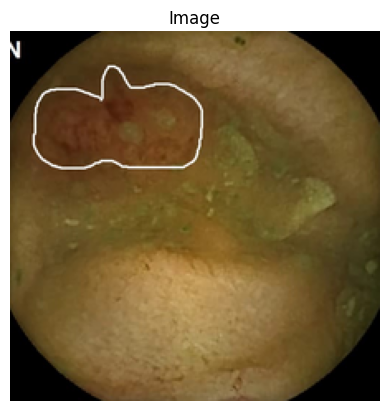

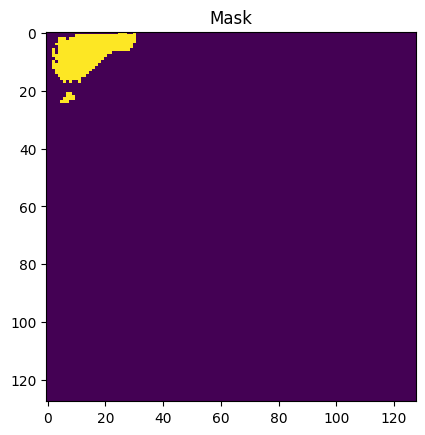

In [171]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image_path = '/kaggle/working/TEST/T1/A0020.png'
img = mpimg.imread(image_path)
plt.imshow(img)
plt.title('Image')
plt.axis('off')
plt.show()
plt.imshow(predictions[19][0],interpolation='nearest')  
plt.title('Mask')
plt.show()

In [180]:
predictions_2 = []
from tqdm.notebook import tqdm
for path in tqdm(os.listdir(image_paths_list_2)):
    p1 = os.path.join(image_paths_list_2, path)
    image = cv2.imread(p1) 
    image = cv2.resize(image , IMAGE_SIZE)
    image = np.array(image)
    image = image.reshape(1, *image.shape)
    image = image / 255
    predictions_2.append(get_mask(model,image, 0.2))

  0%|          | 0/515 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


In [183]:
predictions_encoded_2 = [mask_to_rle(mask) for mask in tqdm(predictions_2)]
sample_submission_2['EncodedPixels'] = predictions_encoded_2
sample_submission_2.to_csv('submission_2.csv', index=False)
sample_submission_2.head()

  0%|          | 0/515 [00:00<?, ?it/s]

,files,EncodedPixels
0,A0550.png,1046 1 1173 1 1181 4 1309 5 1315 1 1437 6 1566...
1,A0052.png,NaN
2,A0558.png,2712 1 2793 1 2835 1 2837 3 2920 4 2963 5 2969...
3,A0357.png,517 1 647 1
4,A0159.png,28 2 31 25 154 40 280 47 407 52 533 54 659 56 ...


In [189]:
len(predictions)

49

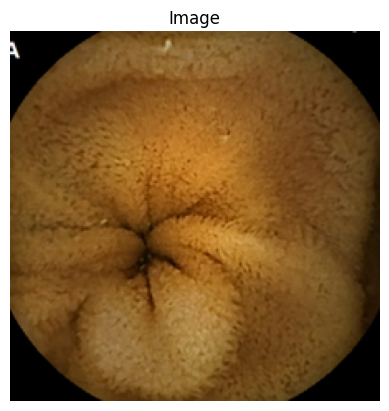

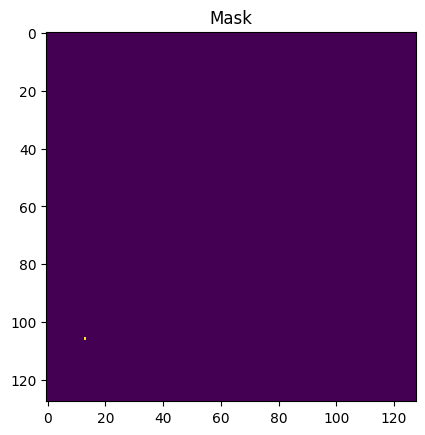

In [207]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

image_path = '/kaggle/working/TEST/T2/A0104.png'
img = mpimg.imread(image_path)
plt.imshow(img)
plt.title('Image')
plt.axis('off')
plt.show()
plt.imshow(predictions_2[54][0],interpolation='nearest')  
plt.title('Mask')
plt.show()